In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/segmentation-encoder-model/pytorch/default/1/encoder_model.pth
/kaggle/input/camvid/decoder.pth
/kaggle/input/camvid/deeplabv3.pth
/kaggle/input/camvid/CamVid/CamVid/class_dict.csv
/kaggle/input/camvid/CamVid/CamVid/test_labels/0001TP_008010_L.png
/kaggle/input/camvid/CamVid/CamVid/test_labels/0001TP_008580_L.png
/kaggle/input/camvid/CamVid/CamVid/test_labels/0006R0_f01650_L.png
/kaggle/input/camvid/CamVid/CamVid/test_labels/0006R0_f03690_L.png
/kaggle/input/camvid/CamVid/CamVid/test_labels/0001TP_007920_L.png
/kaggle/input/camvid/CamVid/CamVid/test_labels/0001TP_008160_L.png
/kaggle/input/camvid/CamVid/CamVid/test_labels/0001TP_008370_L.png
/kaggle/input/camvid/CamVid/CamVid/test_labels/0001TP_007110_L.png
/kaggle/input/camvid/CamVid/CamVid/test_labels/0001TP_009660_L.png
/kaggle/input/camvid/CamVid/CamVid/test_labels/0006R0_f02520_L.png
/kaggle/input/camvid/CamVid/CamVid/test_labels/0001TP_008520_L.png
/kaggle/input/camvid/CamVid/CamVid/test_labels/0016E5_08131_L.png
/k

In [1]:
print("Hello, world")

Hello, world


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from PIL import Image
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix
import torchvision
import torchvision.transforms as transforms
import torch.optim as optim
import torchvision.models as models
import wandb
import random

seed = 2022561
torch.manual_seed(seed)
device = 'cuda' if torch.cuda.is_available() else 'cpu'
file_path = "/kaggle/input/camvid/CamVid/CamVid/"

In [20]:
wandb_api_key = '52e278bf12b8377d42af753c3449b8777d39b6e3'
wandb.login(key=wandb_api_key) # API key: 52e278bf12b8377d42af753c3449b8777d39b6e3

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: varin22561 (varin22561-iiitd). Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [3]:
train_data_paths = os.listdir(file_path + "train/")
train_label_paths = os.listdir(file_path + "train_labels/")
test_data_paths = os.listdir(file_path + "test_images/")
test_label_paths = os.listdir(file_path + "test_labels/")

train_data_paths = [file_path + "train/" + path for path in train_data_paths]
train_label_paths = [file_path + "train_labels/" + path for path in train_label_paths]
test_data_paths = [file_path + "test_images/" + path for path in test_data_paths]
test_label_paths = [file_path + "test_labels/" + path for path in test_label_paths]

print("# Images in Train Data:", len(train_data_paths))
print("# Images in Test Data:", len(test_data_paths))

# Images in Train Data: 369
# Images in Test Data: 232


In [4]:
train_data_paths.sort()
train_label_paths.sort()
test_data_paths.sort()
test_label_paths.sort()

In [5]:
print(train_data_paths[1])
print(train_label_paths[1])

/kaggle/input/camvid/CamVid/CamVid/train/0001TP_009240.png
/kaggle/input/camvid/CamVid/CamVid/train_labels/0001TP_009240_L.png


In [6]:
count = 0

print("Train Data Checking")
for i in range(len(train_data_paths)):
    if train_data_paths[i].split('/')[-1][:-4] not in train_label_paths[i].split('/')[-1]:
        count += 1
        print(train_data_paths[i].split('/')[-1], train_label_paths[i].split('/')[-1])

print("Total counts:", count)

Train Data Checking
Total counts: 0


In [7]:
count = 0

print("Test Data Checking")
for i in range(len(test_data_paths)):
    if test_data_paths[i].split('/')[-1][:-4] not in test_label_paths[i].split('/')[-1]:
        count += 1
        print(test_data_paths[i].split('/')[-1], test_label_paths[i].split('/')[-1])

print("Total counts:", count)

Test Data Checking
Total counts: 0


In [8]:
image = Image.open(test_label_paths[0]).convert('RGB')
print(image)
transforms.ToTensor()(image)

<PIL.Image.Image image mode=RGB size=960x720 at 0x78D528EDEA10>


tensor([[[0.5020, 0.5020, 0.5020,  ..., 0.5020, 0.5020, 0.5020],
         [0.5020, 0.5020, 0.5020,  ..., 0.5020, 0.5020, 0.5020],
         [0.5020, 0.5020, 0.5020,  ..., 0.5020, 0.5020, 0.5020],
         ...,
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

        [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         ...,
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

        [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.

In [9]:
class_dict = pd.read_csv(file_path + "class_dict.csv")
class_to_id = {class_dict["name"][i]: tuple(0 if j != i else 1 for j in range(32)) for i in range(32)}
id_to_class = {v: k for k, v in class_to_id.items()}

rgb_to_id = {(class_dict['r'][i], class_dict['g'][i], class_dict['b'][i]): np.array([0 if j != i else 1 for j in range(32)]) for i in range(32)}
id_to_rgb = {tuple(v): k for k, v in rgb_to_id.items()}

In [10]:
np.array(((1, 2), (2, 3), (3, 4)))

array([[1, 2],
       [2, 3],
       [3, 4]])

In [11]:
class CamVidDataset(Dataset):
    def __init__(self, data_paths, label_paths, transform=None):
        self.data_paths = data_paths
        self.label_paths = label_paths
        
        self.transform = transforms.Compose([
            transforms.Resize((480, 360)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

        if transform:
            self.transform = transforms.Compose([
                *self.transform.transforms,
                *transform.transforms
            ])

    def convert_rgb_to_id(self, image):
        image = image.resize((480, 360), Image.NEAREST)
        image = np.array(image)
        
        new_image = np.zeros((360, 480, 32), dtype=np.float32)

        i = 0
        for rgb, class_id in rgb_to_id.items():
            image_indices = np.all(image == np.array(rgb), axis=-1)
            new_image[image_indices] = class_id
            i += 1

        return torch.tensor(new_image, dtype=torch.float32)
    
    def __len__(self):
        return len(self.data_paths)

    def __getitem__(self, index):
        data = Image.open(self.data_paths[index]).convert('RGB')
        label = Image.open(self.label_paths[index]).convert('RGB')

        data = self.transform(data).permute(0, 2, 1)
        label = self.convert_rgb_to_id(label).permute(2, 0, 1)

        return data, label

In [12]:
train_dataset = CamVidDataset(data_paths=train_data_paths, label_paths=train_label_paths)
test_dataset = CamVidDataset(data_paths=test_data_paths, label_paths=test_label_paths)

train_loader = DataLoader(train_dataset, batch_size=3, shuffle=True, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=False, num_workers=4)

In [13]:
data_0, label_0 = train_dataset[0]
print(data_0.shape) # (3, 480, 360)
print(label_0.shape) # (360, 480, 32)

torch.Size([3, 360, 480])
torch.Size([32, 360, 480])


In [19]:
%%time

def get_class_distribution(dataset):
    class_count = np.zeros(32)
    for _, labels in dataset:
        class_count += np.sum(labels.numpy(), axis=(1, 2))

    return class_count

train_count = get_class_distribution(train_dataset)
test_count = get_class_distribution(test_dataset)

train_count /= train_count.sum()
test_count /= test_count.sum()

CPU times: user 2min 27s, sys: 1.38 s, total: 2min 28s
Wall time: 2min 19s


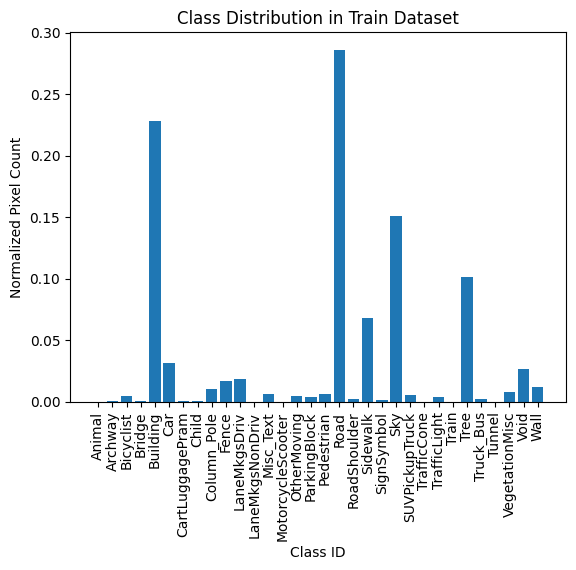

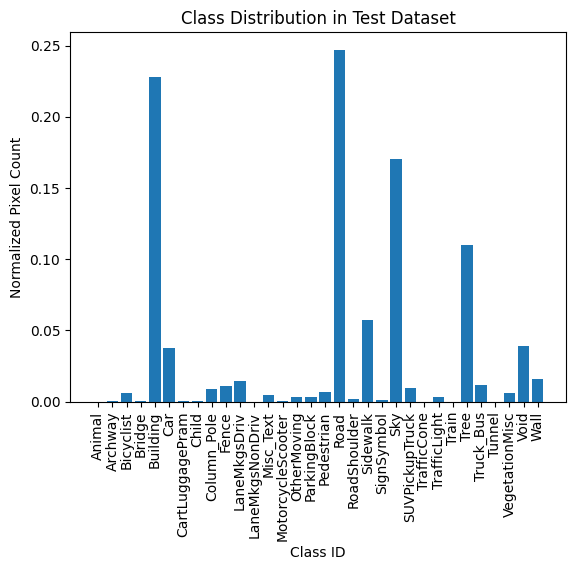

In [20]:
plt.bar(range(32), train_count)
plt.xlabel("Class ID")
plt.ylabel("Normalized Pixel Count")
plt.title("Class Distribution in Train Dataset")
plt.xticks(range(32), list(class_to_id.keys()), rotation=90)
plt.show()

plt.bar(range(32), test_count)
plt.xlabel("Class ID")
plt.ylabel("Normalized Pixel Count")
plt.title("Class Distribution in Test Dataset")
plt.xticks(range(32), list(class_to_id.keys()), rotation=90)
plt.show()

In [14]:
id_to_rgb.values()

dict_values([(64, 128, 64), (192, 0, 128), (0, 128, 192), (0, 128, 64), (128, 0, 0), (64, 0, 128), (64, 0, 192), (192, 128, 64), (192, 192, 128), (64, 64, 128), (128, 0, 192), (192, 0, 64), (128, 128, 64), (192, 0, 192), (128, 64, 64), (64, 192, 128), (64, 64, 0), (128, 64, 128), (128, 128, 192), (0, 0, 192), (192, 128, 128), (128, 128, 128), (64, 128, 192), (0, 0, 64), (0, 64, 64), (192, 64, 128), (128, 128, 0), (192, 128, 192), (64, 0, 64), (192, 192, 0), (0, 0, 0), (64, 192, 0)])

In [15]:
def convert_id_to_rgb(image):
    # print(image.shape)
    image = image.permute(1, 2, 0)
    image = image.numpy()
    rgb_image = np.zeros((360, 480, 3), dtype=np.float32)

    i = 0
    for class_id, rgb_val in id_to_rgb.items():
        image_indices = image[:, :, i] == 1
        rgb_image[image_indices] = np.array(rgb_val)
        i += 1

    return torch.tensor(rgb_image, dtype=torch.float32)

In [16]:
convert_id_to_rgb((train_dataset[0])[1])[0][0]

tensor([128., 128., 128.])

In [27]:
%%time

class_samples = {i: [] for i in range(32)}

print("Train Dataset:")
for i in range(len(train_dataset)):
    image, label = train_dataset[i]
    image = image.permute(0, 1, 2) # try 0, 2, 1
    label = label.permute(1, 2, 0)
    label = label.numpy()

    for j in range(32):
        if np.sum(label[:, :, j] == 1) > 10 and len(class_samples[j]) < 2:
            rgb_label = np.zeros((360, 480, 3))
            class_index = label[:, :, j] == 1
            other_index = label[:, :, j] == 0
            if j == 30:
                rgb_label[class_index] = np.array(list(id_to_rgb.items())[0][1])
            else:
                rgb_label[class_index] = np.array(list(id_to_rgb.items())[j][1])

            rgb_label[other_index] = np.array([0, 0, 0])
            if len(class_samples[j]) == 1:
                print(j, list(id_to_class.items())[j][1])
                
            class_samples[j].append((image, rgb_label))

    if all(len(value) > 2 for value in class_samples.values()):
        break

print("\nTest Dataset:")
for i in range(len(test_dataset)):
    image, label = test_dataset[i]
    image = image.permute(0, 1, 2)
    label = label.permute(1, 2, 0)
    label = label.numpy()

    for j in range(32):
        if np.sum(label[:, :, j] == 1) > 10 and len(class_samples[j]) < 2:
            rgb_label = np.zeros((360, 480, 3))
            class_index = label[:, :, j] == 1
            other_index = label[:, :, j] == 0
            rgb_label[class_index] = np.array(list(id_to_rgb.items())[j][1])
            rgb_label[other_index] = np.array([0, 0, 0])
            if len(class_samples[j]) == 1:
                print(j, list(id_to_class.items())[j][1])
                
            class_samples[j].append((image, rgb_label))

    if all(len(value) > 2 for value in class_samples.values()):
        break

Train Dataset:
4 Building
5 Car
8 Column_Pole
10 LaneMkgsDriv
12 Misc_Text
16 Pedestrian
17 Road
19 Sidewalk
21 Sky
22 SUVPickupTruck
24 TrafficLight
26 Tree
30 Void
31 Wall
2 Bicyclist
6 CartLuggagePram
14 OtherMoving
29 VegetationMisc
27 Truck_Bus
9 Fence
15 ParkingBlock
18 RoadShoulder
20 SignSymbol
3 Bridge
23 TrafficCone
1 Archway
13 MotorcycleScooter
7 Child
11 LaneMkgsNonDriv
0 Animal

Test Dataset:
CPU times: user 2min 48s, sys: 541 ms, total: 2min 48s
Wall time: 2min 30s


In [28]:
print("Entities Not Found:")
for k, v in class_samples.items():
    if len(v) < 2:
        print(list(id_to_class.items())[k][1])

Entities Not Found:
Train
Tunnel


In [29]:
torch.tensor(class_samples[0][0][1]).shape

torch.Size([360, 480, 3])

In [30]:
class_samples[0][0][0].permute(2, 1, 0).shape

torch.Size([480, 360, 3])

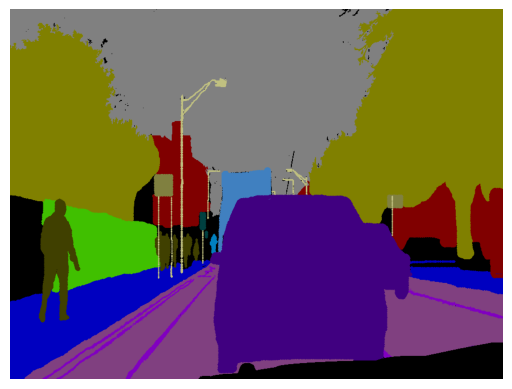

In [31]:
plt.imshow(np.array(Image.open(train_label_paths[0])))
plt.axis("off")
plt.show()

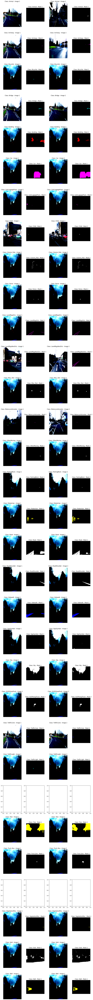

CPU times: user 16.8 s, sys: 416 ms, total: 17.2 s
Wall time: 12.8 s


In [32]:
%%time

fig, axes = plt.subplots(len(class_samples), 4, figsize=(12, 4 * len(class_samples)))

for i, (class_id, samples) in enumerate(class_samples.items()):
    for j, (image, label) in enumerate(samples):
        axes[i, 2 * j].imshow(image.permute(2, 1, 0).numpy())  # Convert (C, H, W) → (H, W, C)
        axes[i, 2 * j].set_title(f"Class: {list(id_to_class.items())[class_id][1]} - Image {j+1}")
        axes[i, 2 * j].axis("off")

        # print(torch.tensor(label).permute(1, 0, 2).numpy().shape)
        # axes[i, 2 * j + 1].imshow(torch.tensor(label).permute(1, 0, 2).numpy(), axis=(0,1))
        axes[i, 2 * j + 1].imshow(torch.tensor(label))
        # axes[i, 2 * j + 1].imshow(label.permute(1, 2, 0).numpy())
        axes[i, 2 * j + 1].set_title(f"Class: {list(id_to_class.items())[class_id][1]} - Mask {j+1}")
        axes[i, 2 * j + 1].axis("off")

plt.tight_layout()
plt.show()

In [17]:
class SegNet_Encoder(nn.Module):
    def __init__(self, in_chn=3, out_chn=32, BN_momentum=0.5):
        super(SegNet_Encoder, self).__init__()

        #SegNet Architecture
        #Takes input of size in_chn = 3 (RGB images have 3 channels)
        #Outputs size label_chn (N # of classes)

        #ENCODING consists of 5 stages
        #Stage 1, 2 has 2 layers of Convolution + Batch Normalization + Max Pool respectively
        #Stage 3, 4, 5 has 3 layers of Convolution + Batch Normalization + Max Pool respectively

        #General Max Pool 2D for ENCODING layers
        #Pooling indices are stored for Upsampling in DECODING layers

        self.in_chn = in_chn
        self.out_chn = out_chn

        self.MaxEn = nn.MaxPool2d(2, stride=2, return_indices=True) 

        self.ConvEn11 = nn.Conv2d(self.in_chn, 64, kernel_size=3, padding=1)
        self.BNEn11 = nn.BatchNorm2d(64, momentum=BN_momentum)
        self.ConvEn12 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.BNEn12 = nn.BatchNorm2d(64, momentum=BN_momentum)

        self.ConvEn21 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.BNEn21 = nn.BatchNorm2d(128, momentum=BN_momentum)
        self.ConvEn22 = nn.Conv2d(128, 128, kernel_size=3, padding=1)
        self.BNEn22 = nn.BatchNorm2d(128, momentum=BN_momentum)

        self.ConvEn31 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.BNEn31 = nn.BatchNorm2d(256, momentum=BN_momentum)
        self.ConvEn32 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.BNEn32 = nn.BatchNorm2d(256, momentum=BN_momentum)
        self.ConvEn33 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.BNEn33 = nn.BatchNorm2d(256, momentum=BN_momentum)

        self.ConvEn41 = nn.Conv2d(256, 512, kernel_size=3, padding=1)
        self.BNEn41 = nn.BatchNorm2d(512, momentum=BN_momentum)
        self.ConvEn42 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.BNEn42 = nn.BatchNorm2d(512, momentum=BN_momentum)
        self.ConvEn43 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.BNEn43 = nn.BatchNorm2d(512, momentum=BN_momentum)

        self.ConvEn51 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.BNEn51 = nn.BatchNorm2d(512, momentum=BN_momentum)
        self.ConvEn52 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.BNEn52 = nn.BatchNorm2d(512, momentum=BN_momentum)
        self.ConvEn53 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.BNEn53 = nn.BatchNorm2d(512, momentum=BN_momentum)
    
    def forward(self,x):
        #ENCODE LAYERS
        #Stage 1
        x = F.relu(self.BNEn11(self.ConvEn11(x))) 
        x = F.relu(self.BNEn12(self.ConvEn12(x))) 
        x, ind1 = self.MaxEn(x)
        size1 = x.size()

        #Stage 2
        x = F.relu(self.BNEn21(self.ConvEn21(x))) 
        x = F.relu(self.BNEn22(self.ConvEn22(x))) 
        x, ind2 = self.MaxEn(x)
        size2 = x.size()

        #Stage 3
        x = F.relu(self.BNEn31(self.ConvEn31(x))) 
        x = F.relu(self.BNEn32(self.ConvEn32(x))) 
        x = F.relu(self.BNEn33(self.ConvEn33(x)))   
        x, ind3 = self.MaxEn(x)
        size3 = x.size()

        #Stage 4
        x = F.relu(self.BNEn41(self.ConvEn41(x))) 
        x = F.relu(self.BNEn42(self.ConvEn42(x))) 
        x = F.relu(self.BNEn43(self.ConvEn43(x)))   
        x, ind4 = self.MaxEn(x)
        size4 = x.size()

        #Stage 5
        x = F.relu(self.BNEn51(self.ConvEn51(x))) 
        x = F.relu(self.BNEn52(self.ConvEn52(x))) 
        x = F.relu(self.BNEn53(self.ConvEn53(x)))   
        x, ind5 = self.MaxEn(x)
        size5 = x.size()
        return x,[ind1,ind2,ind3,ind4,ind5],[size1,size2,size3,size4,size5]
    


class SegNet_Decoder(nn.Module):
    def __init__(self, in_chn=3, out_chn=32, BN_momentum=0.5):
        super(SegNet_Decoder, self).__init__()
        self.in_chn = in_chn
        self.out_chn = out_chn

        self.max_unpool = nn.MaxUnpool2d(2, stride=2)

        # Stage 5:
        # Max Unpooling: Upsample using ind5 to size4
        # Channels: 512 → 512 → 512 (3 convolutions)
        # Batch Norm: Applied after each convolution
        # Activation: ReLU after each batch norm
        self.conv51 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.bn51 = nn.BatchNorm2d(512, momentum=BN_momentum)
        self.conv52 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.bn52 = nn.BatchNorm2d(512, momentum=BN_momentum)
        self.conv53 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.bn53 = nn.BatchNorm2d(512, momentum=BN_momentum)

        # Stage 4:
        # Max Unpooling: Upsample using ind4 to size3
        # Channels: 512 → 512 → 256 (3 convolutions)
        # Batch Norm: Applied after each convolution
        # Activation: ReLU after each batch norm
        self.conv41 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.bn41 = nn.BatchNorm2d(512, momentum=BN_momentum)
        self.conv42 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.bn42 = nn.BatchNorm2d(512, momentum=BN_momentum)
        self.conv43 = nn.Conv2d(512, 256, kernel_size=3, padding=1)
        self.bn43 = nn.BatchNorm2d(256, momentum=BN_momentum)
        
        # Stage 3:
        # Max Unpooling: Upsample using ind3 to size2
        # Channels: 256 → 256 → 128 (3 convolutions)
        # Batch Norm: Applied after each convolution
        # Activation: ReLU after each batch norm
        self.conv31 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.bn31 = nn.BatchNorm2d(256, momentum=BN_momentum)
        self.conv32 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.bn32 = nn.BatchNorm2d(256, momentum=BN_momentum)
        self.conv33 = nn.Conv2d(256, 128, kernel_size=3, padding=1)
        self.bn33 = nn.BatchNorm2d(128, momentum=BN_momentum)

        # Stage 2:
        # Max Unpooling: Upsample using ind2 to size1
        # Channels:  128 → 64 (2 convolutions)
        # Batch Norm: Applied after each convolution
        # Activation: ReLU after each batch norm
        self.conv21 = nn.Conv2d(128, 128, kernel_size=3, padding=1)
        self.bn21 = nn.BatchNorm2d(128, momentum=BN_momentum)
        self.conv22 = nn.Conv2d(128, 64, kernel_size=3, padding=1)
        self.bn22 = nn.BatchNorm2d(64, momentum=BN_momentum)

        # Stage 1:
        # Max Unpooling: Upsample using ind1
        # Channels: 64 → out_chn (2 convolutions)
        # Batch Norm: Applied after each convolution
        # Activation: ReLU after the first convolution, no activation after the last one
        self.conv11 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.bn11 = nn.BatchNorm2d(64, momentum=BN_momentum)
        self.conv12 = nn.Conv2d(64, out_chn, kernel_size=3, padding=1)
        self.bn12 = nn.BatchNorm2d(out_chn, momentum=BN_momentum)

        # For convolution use kernel size = 3, padding =1 
        # For max unpooling use kernel size = 2, stride = 2

    def forward(self, x, indexes, sizes):
        # print(indexes[4].shape, sizes[4])

        # Stage 5
        x = self.max_unpool(x, indexes[4], sizes[3])
        x = F.relu(self.bn51(self.conv51(x)))
        x = F.relu(self.bn52(self.conv52(x)))
        x = F.relu(self.bn53(self.conv53(x)))

        # Stage 4
        x = self.max_unpool(x, indexes[3], sizes[2])
        x = F.relu(self.bn41(self.conv41(x)))
        x = F.relu(self.bn42(self.conv42(x)))
        x = F.relu(self.bn43(self.conv43(x)))

        # Stage 3
        x = self.max_unpool(x, indexes[2], sizes[1])
        x = F.relu(self.bn31(self.conv31(x)))
        x = F.relu(self.bn32(self.conv32(x)))
        x = F.relu(self.bn33(self.conv33(x)))

        # Stage 2
        x = self.max_unpool(x, indexes[1], sizes[0])
        x = F.relu(self.bn21(self.conv21(x)))
        x = F.relu(self.bn22(self.conv22(x)))

        # Stage 1
        x = self.max_unpool(x, indexes[0])
        x = F.relu(self.bn11(self.conv11(x)))
        x = self.bn12(self.conv12(x))
        return x


class SegNet_Pretrained(nn.Module):
    def __init__(self,encoder_weight_pth,in_chn=3, out_chn=32):
        super(SegNet_Pretrained, self).__init__()
        self.in_chn = in_chn
        self.out_chn = out_chn
        self.encoder=SegNet_Encoder(in_chn=self.in_chn,out_chn=self.out_chn)
        self.decoder=SegNet_Decoder(in_chn=self.in_chn,out_chn=self.out_chn)
        
        encoder_state_dict = torch.load(encoder_weight_pth, weights_only=True)

        # Load weights into the encoder
        self.encoder.load_state_dict(encoder_state_dict)

        # Freeze encoder weights
        for param in self.encoder.parameters():
            param.requires_grad = False

    def forward(self,x):
        x,indexes,sizes=self.encoder(x)
        x=self.decoder(x,indexes,sizes)
        return x


class DeepLabV3(nn.Module):
    def __init__(self, num_classes=32):
        super(DeepLabV3, self).__init__()
        self.model = models.segmentation.deeplabv3_resnet50(pretrained=True) # TODO: Initialize DeepLabV3 model here using pretrained=True
        self.model.classifier[4] = nn.Conv2d(256, num_classes, kernel_size=1, stride=1) #  should be a Conv2D layer with input channels as 256 and output channel as num_classes using a stride of 1, and kernel size of 1.
        
    def forward(self, x):
        return self.model(x)['out']

In [18]:
segnet_model = SegNet_Pretrained("/kaggle/input/segmentation-encoder-model/pytorch/default/1/encoder_model.pth", in_chn=3, out_chn=32).to(device)

In [22]:
run = wandb.init(project="segnet-training")

In [23]:
num_epochs = 10
learning_rate = 1e-3

In [24]:
image, label = train_dataset[0]
print(image.shape)
print(label.shape)

torch.Size([3, 360, 480])
torch.Size([32, 360, 480])


In [25]:
%%time

segnet_model.train()

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(segnet_model.parameters(), lr=learning_rate)

for epoch in range(num_epochs):
    running_loss = 0.0
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        # print("works")

        optimizer.zero_grad()
        outputs = segnet_model(images)
        # print("check1")
        loss = criterion(outputs, labels)
        # print("check2")
        loss.backward()
        # print("check3")
        optimizer.step()
        # print("check4")

        running_loss += loss.item()

        del images, labels, outputs, loss
        torch.cuda.empty_cache()

    avg_loss = running_loss / len(train_loader)
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {avg_loss:.4f}")

    wandb.log({"Epoch": epoch + 1, "Loss": avg_loss})

Epoch [1/10], Loss: 2.6671
Epoch [2/10], Loss: 2.1414
Epoch [3/10], Loss: 1.9108
Epoch [4/10], Loss: 1.7193
Epoch [5/10], Loss: 1.5631
Epoch [6/10], Loss: 1.4510
Epoch [7/10], Loss: 1.3453
Epoch [8/10], Loss: 1.2541
Epoch [9/10], Loss: 1.2096
Epoch [10/10], Loss: 1.1469
CPU times: user 2min 41s, sys: 1min 31s, total: 4min 13s
Wall time: 8min 48s


In [26]:
wandb.finish()

Epoch,▁▂▃▃▄▅▆▆▇█
Loss,█▆▅▄▃▂▂▁▁▁
Epoch,10
Loss,1.14692


In [27]:
torch.save(segnet_model.decoder.state_dict(), "decoder.pth")

In [37]:
segnet_model = SegNet_Pretrained("/kaggle/input/segmentation-encoder-model/pytorch/default/1/encoder_model.pth", in_chn=3, out_chn=32).to(device)
segnet_model.decoder.load_state_dict(torch.load("/kaggle/input/camvid/decoder.pth", weights_only=True))

<All keys matched successfully>

In [49]:
def compute_metrics(predictions, labels, num_classes=32, device="cuda"):
    metrics = {
        "pixel_acc": [],
        "dice": [],
        "iou": [],
    }

    total_iou = []
    
    for cls in range(num_classes):
        pred_cls = (predictions[:, cls, :, :] == 1).to(device)
        label_cls = (labels[:, cls, :, :] == 1).to(device)

        TP, FP, FN, TN = torch.sum(pred_cls & label_cls).item(), torch.sum(pred_cls & ~label_cls).item(), torch.sum(~pred_cls & label_cls).item(), torch.sum(~pred_cls & ~label_cls).item()

        pixel_acc = (TP + TN) / (TP + FP + FN + TN) if (TP + FP + FN + TN) > 0 else 0
        dice = (2 * TP) / (2 * TP + FP + FN) if (2 * TP + FP + FN) > 0 else 0
        iou = TP / (TP + FP + FN) if (TP + FP + FN) > 0 else 0
        # print(pixel_acc)
        # print(dice)
        # print(iou)

        metrics["pixel_acc"].append(pixel_acc)
        metrics["dice"].append(dice)
        metrics["iou"].append(iou)
        total_iou.append(iou)
        # print(total_iou)

    metrics["mIoU"] = np.mean(total_iou)

    return metrics

In [50]:
def evaluate_segnet(model, test_loader, num_classes=32):
    model.eval()
    
    all_metrics = {
        "pixel_acc": np.zeros(num_classes),
        "dice": np.zeros(num_classes),
        "iou": np.zeros(num_classes),
    }
    total_miou = []
    iou_samples = {cls: [] for cls in range(num_classes)}

    i = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            preds = torch.argmax(outputs, dim=1)
            # print(preds.shape)
            # print(preds)
            outputs_one_hot = F.one_hot(preds.long(), num_classes=32)
            # print(outputs_one_hot.shape)
            outputs_one_hot = outputs_one_hot.permute(0, 3, 1, 2)
            # print(outputs_one_hot[:, 0, :, :].shape)
            
            metrics = compute_metrics(outputs_one_hot, labels, num_classes)
            
            for key in all_metrics.keys():
                all_metrics[key] += np.array(metrics[key])
            total_miou.append(metrics["mIoU"])

            print("Batch:", i)
            i += 1

            for cls in range(num_classes):
                for j in range(images.shape[0]):
                    if metrics["iou"][cls] <= 0.5 and len(iou_samples[cls]) < 3:
                        iou_samples[cls].append((images[j].cpu(), labels[j].cpu(), outputs_one_hot[j].cpu()))
    
    num_batches = len(test_loader)
    print("Num_Batches:", num_batches)
    
    for key in all_metrics.keys():
        all_metrics[key] /= num_batches
    
    all_metrics["mIoU"] = np.mean(total_miou)
    
    return all_metrics, iou_samples

In [51]:
torch.cuda.empty_cache()

In [52]:
segnet_metrics, iou_samples = evaluate_segnet(segnet_model, test_loader)

Batch: 0
Batch: 1
Batch: 2
Batch: 3
Batch: 4
Batch: 5
Batch: 6
Batch: 7
Batch: 8
Batch: 9
Batch: 10
Batch: 11
Batch: 12
Batch: 13
Batch: 14
Batch: 15
Batch: 16
Batch: 17
Batch: 18
Batch: 19
Batch: 20
Batch: 21
Batch: 22
Batch: 23
Batch: 24
Batch: 25
Batch: 26
Batch: 27
Batch: 28
Batch: 29
Batch: 30
Batch: 31
Batch: 32
Batch: 33
Batch: 34
Batch: 35
Batch: 36
Batch: 37
Batch: 38
Batch: 39
Batch: 40
Batch: 41
Batch: 42
Batch: 43
Batch: 44
Batch: 45
Batch: 46
Batch: 47
Batch: 48
Batch: 49
Batch: 50
Batch: 51
Batch: 52
Batch: 53
Batch: 54
Batch: 55
Batch: 56
Batch: 57
Num_Batches: 58


In [53]:
print("Class-wise Metrics:\n")
print("Pixel Accuracy:\n", segnet_metrics['pixel_acc'])
print("\nDice Coefficient:\n", segnet_metrics['dice'])
print("\nIoU:\n", segnet_metrics['iou'])
print("\nMean IoU:", segnet_metrics['mIoU'])

Class-wise Metrics:

Pixel Accuracy:
 [0.99994258 0.999789   0.99376579 0.99943686 0.84859203 0.90231407
 0.99966952 0.99973829 0.99095973 0.98462023 0.98568277 0.99997281
 0.99529424 0.99981207 0.9969863  0.99654791 0.99316207 0.91249718
 0.99787885 0.94148335 0.99895761 0.90861947 0.99042173 0.99999042
 0.99634743 1.         0.8727563  0.98854466 1.         0.99406716
 0.96090687 0.98206897]

Dice Coefficient:
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 6.01064571e-01 2.23116690e-01 0.00000000e+00 0.00000000e+00
 0.00000000e+00 8.86412539e-02 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 2.25646664e-05 8.03041374e-01 0.00000000e+00 4.02360001e-01
 0.00000000e+00 7.21694005e-01 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 4.15866269e-01 0.00000000e+00
 0.00000000e+00 0.00000000e+00 4.73607309e-03 4.80038269e-02]

IoU:
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 4.63974580e-01 1.36038030

In [33]:
def visualize_samples(iou_samples, num_classes=32):
    for cls in range(num_classes):
        if len(iou_samples[cls]) == 0:
            continue

        print(list(id_to_class.items())[cls][1])

        plt.figure(figsize=(1,1))
        plt.imshow([[list(id_to_rgb.values())[cls]]])
        plt.axis("off")
        plt.show()
        
        samples = random.sample(iou_samples[cls], min(3, len(iou_samples[cls])))

        fig, axes = plt.subplots(len(samples), 3, figsize=(12, 4 * len(samples)))
        fig.suptitle(f"Class {cls} - Low IoU Samples", fontsize=14)

        for idx, (img, label, pred) in enumerate(samples):
            ax = axes[idx] if len(samples) > 1 else [axes]

            img = img.permute(2, 1, 0).numpy()
            # print(img.shape)
            # print(label.shape)
            # print(pred.shape)
            # label = label.numpy()
            # pred = pred.numpy()

            ax[0].imshow(img)
            ax[0].set_title("Input Image")
            ax[0].axis("off")

            ax[1].imshow(convert_id_to_rgb(label), cmap="viridis")
            ax[1].set_title("Ground Truth Mask")
            ax[1].axis("off")

            ax[2].imshow(convert_id_to_rgb(pred), cmap="viridis")
            ax[2].set_title("Predicted Mask")
            ax[2].axis("off")

        plt.show()

Animal


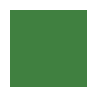

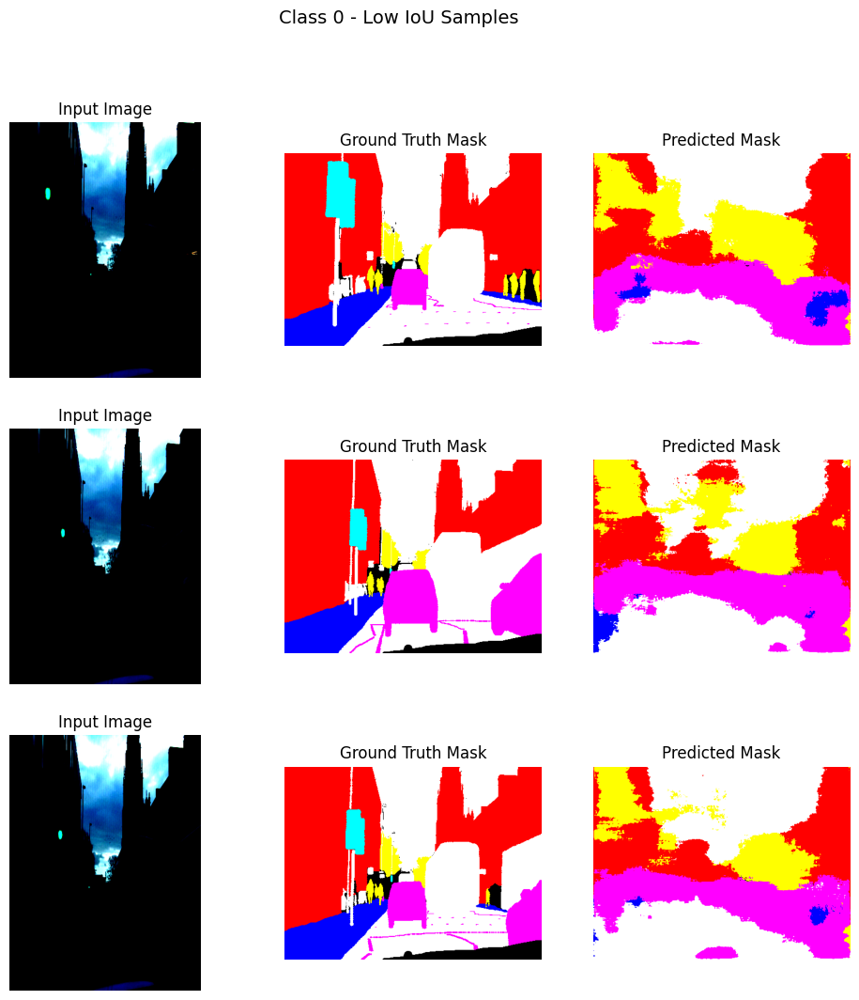

Archway


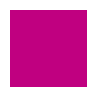

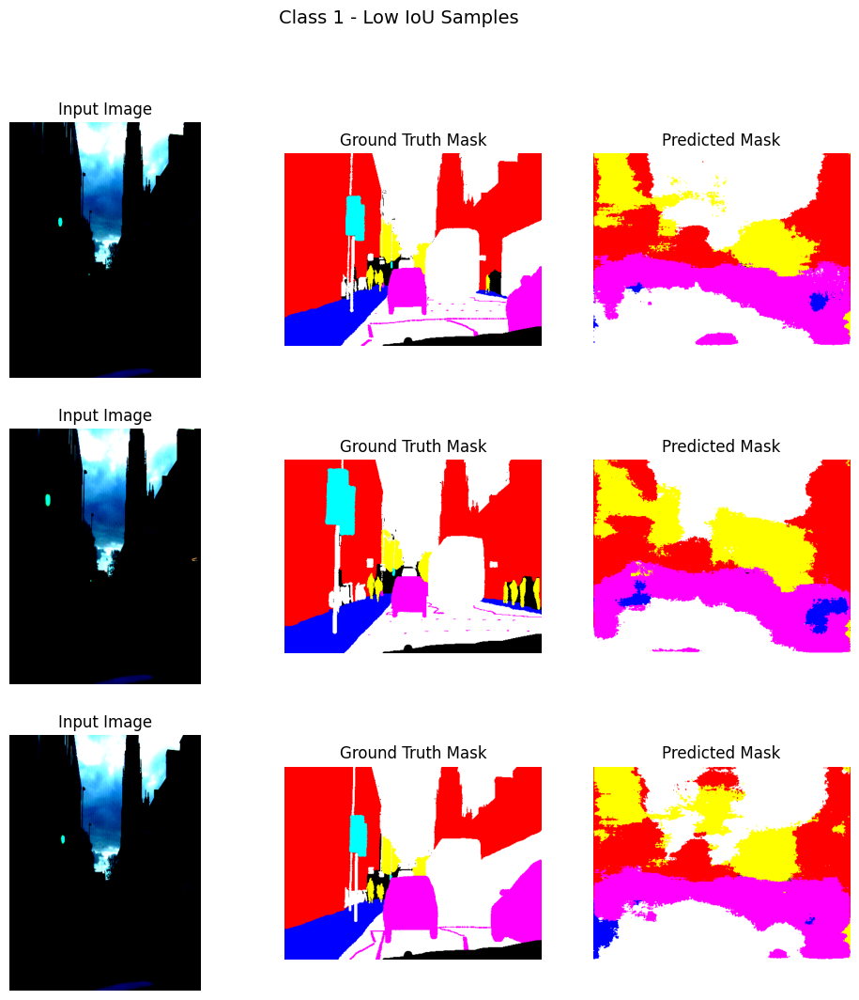

Bicyclist


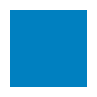

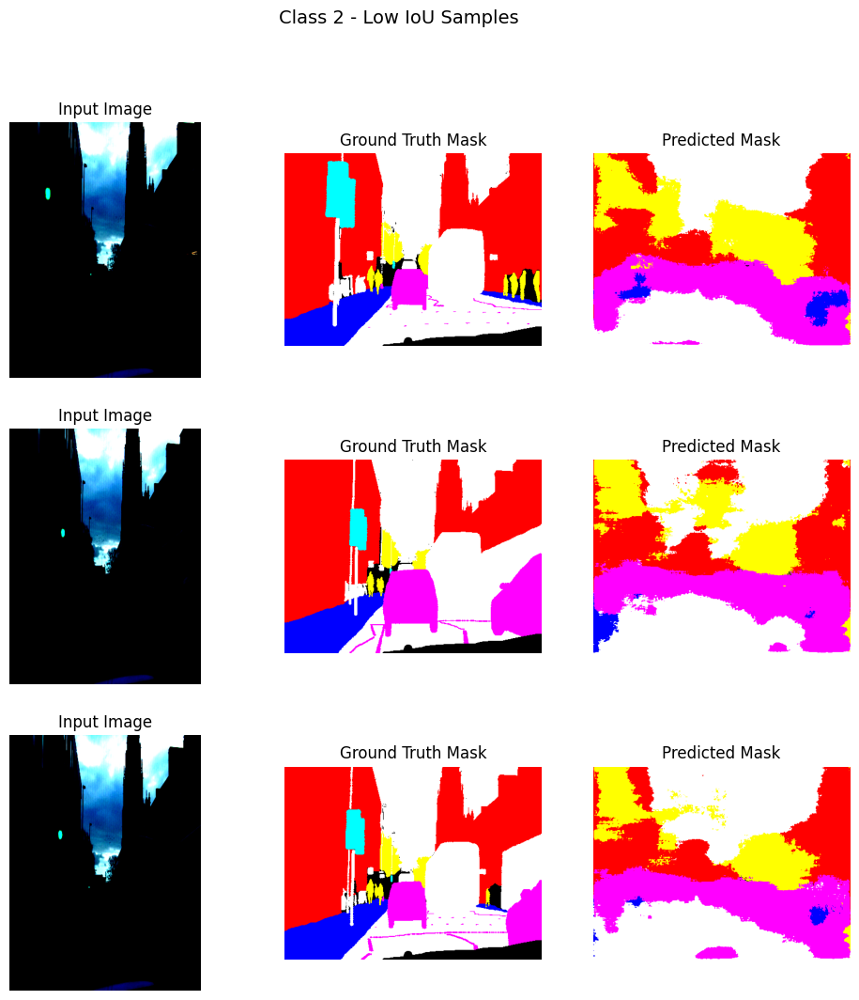

Bridge


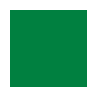

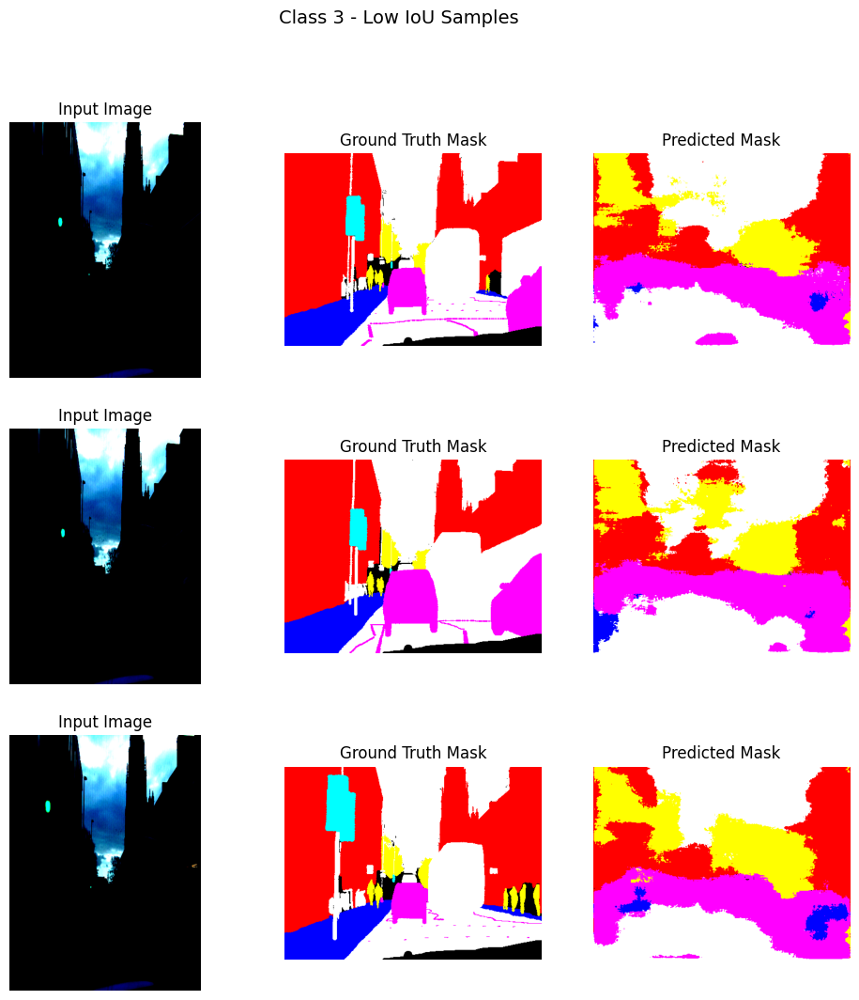

Building


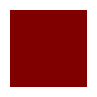

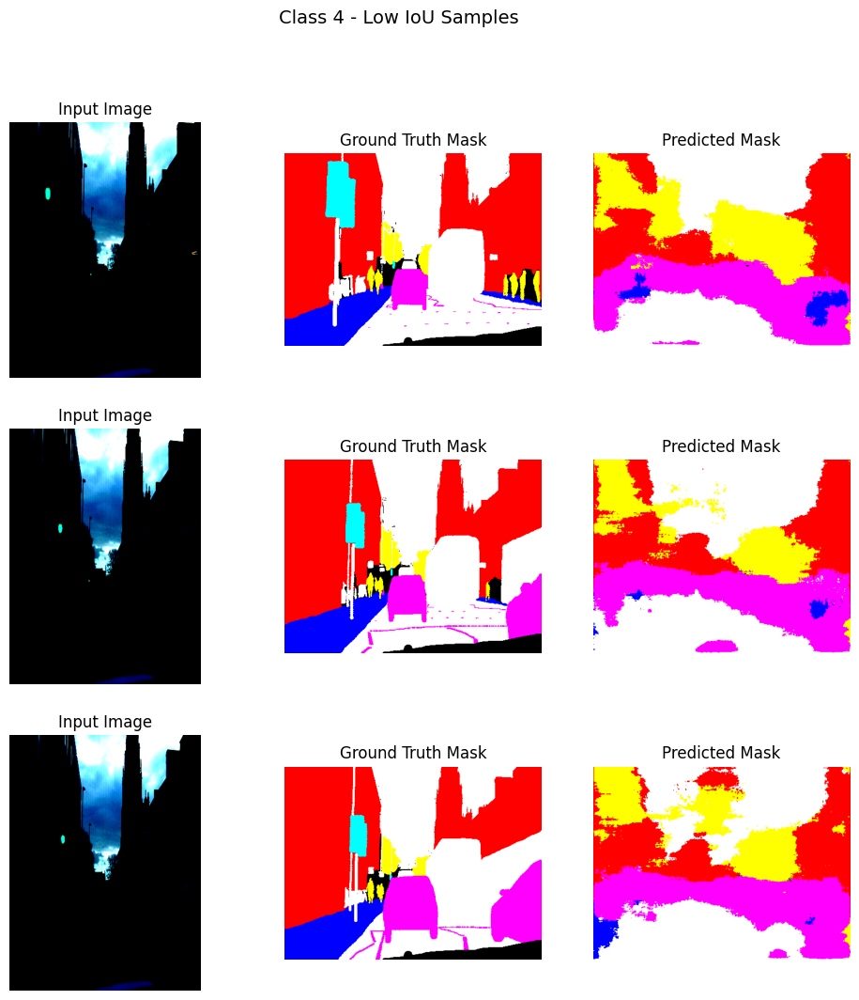

Car


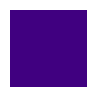

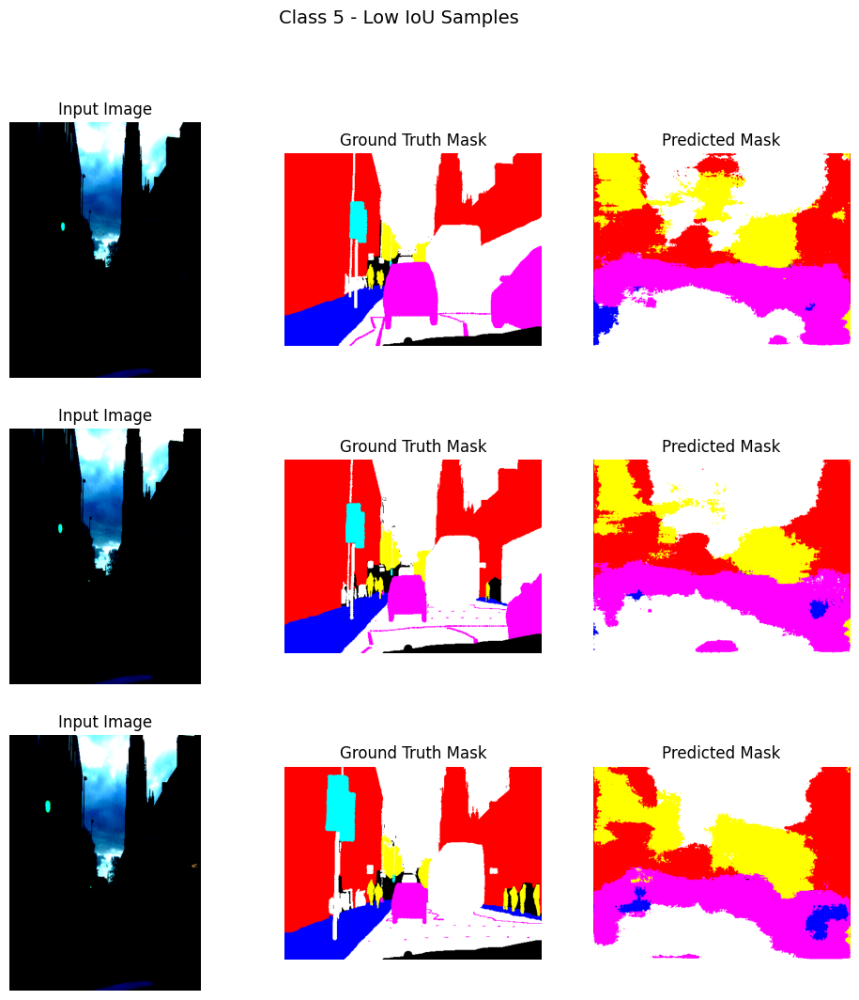

CartLuggagePram


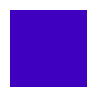

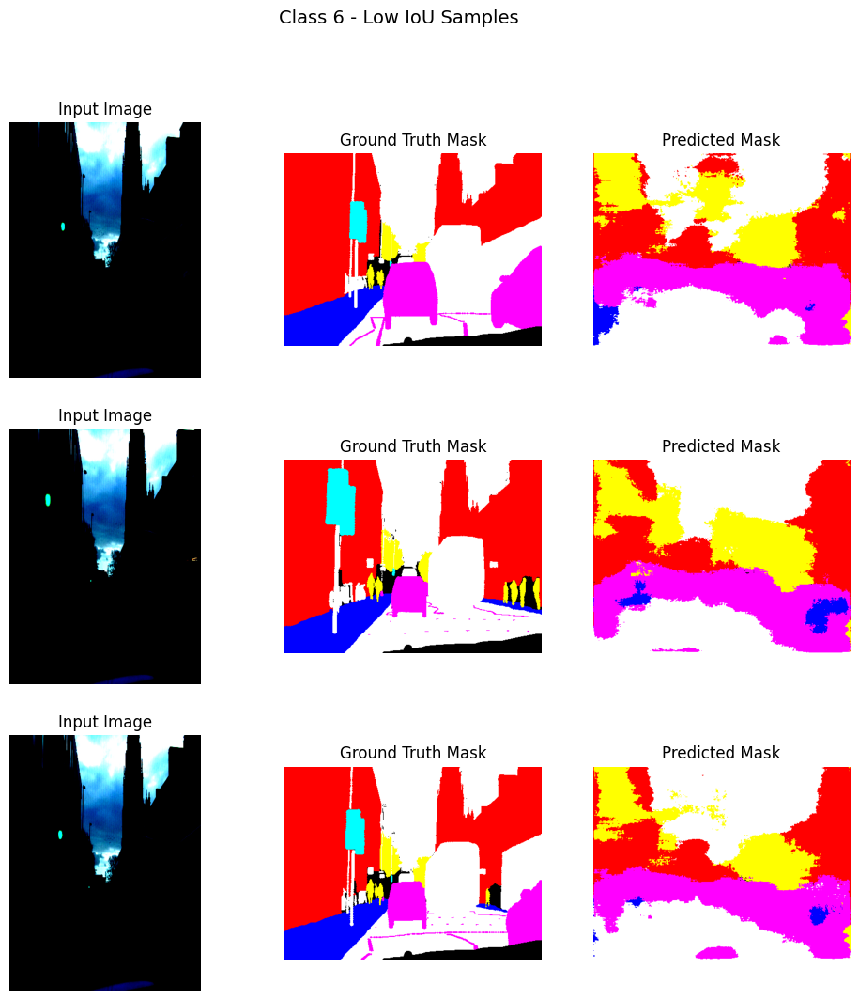

Child


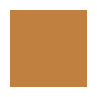

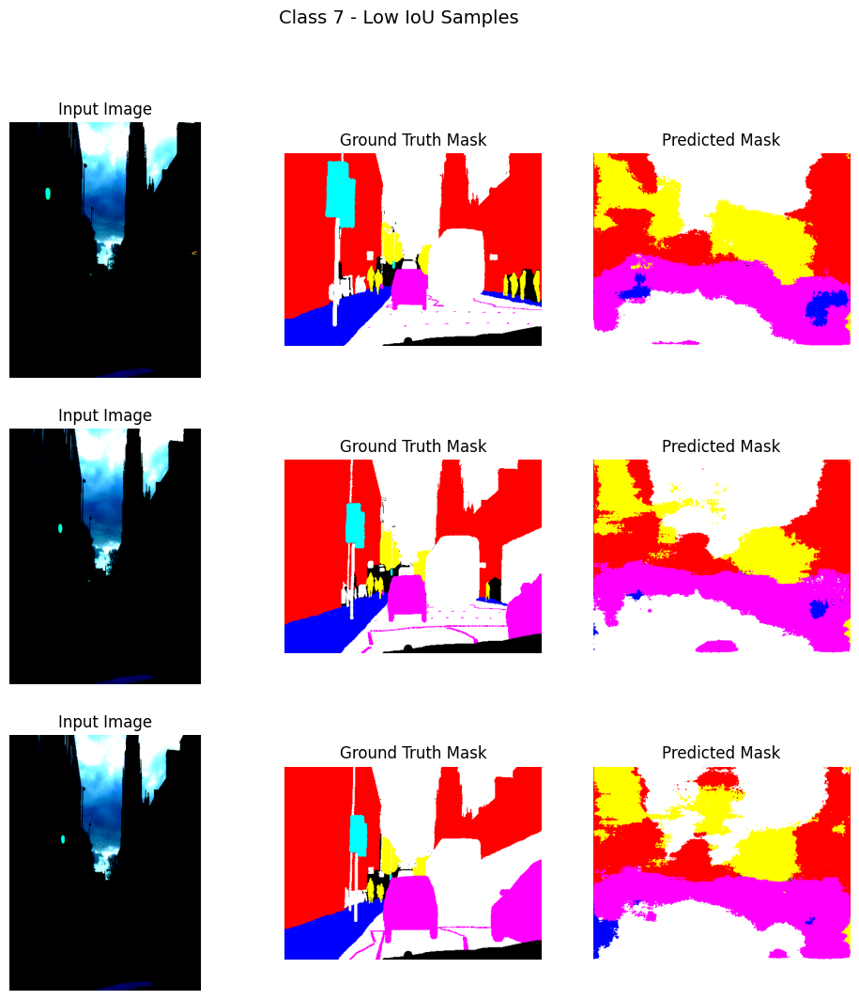

Column_Pole


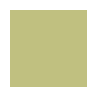

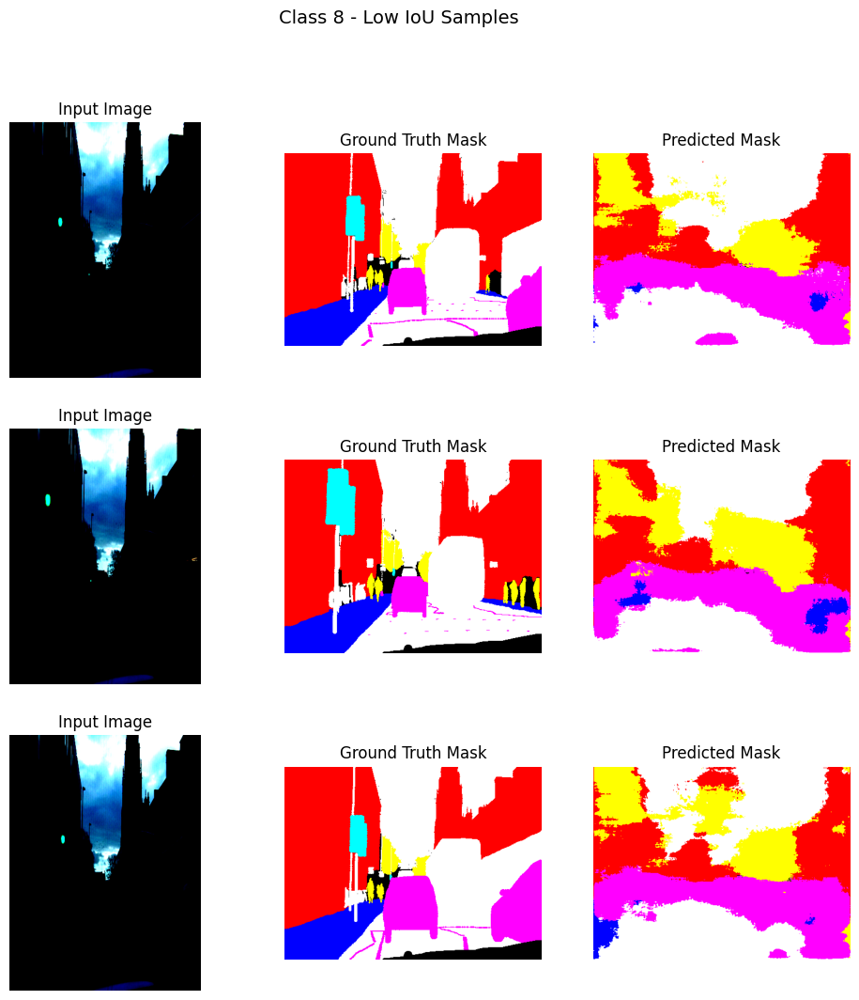

Fence


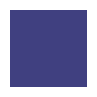

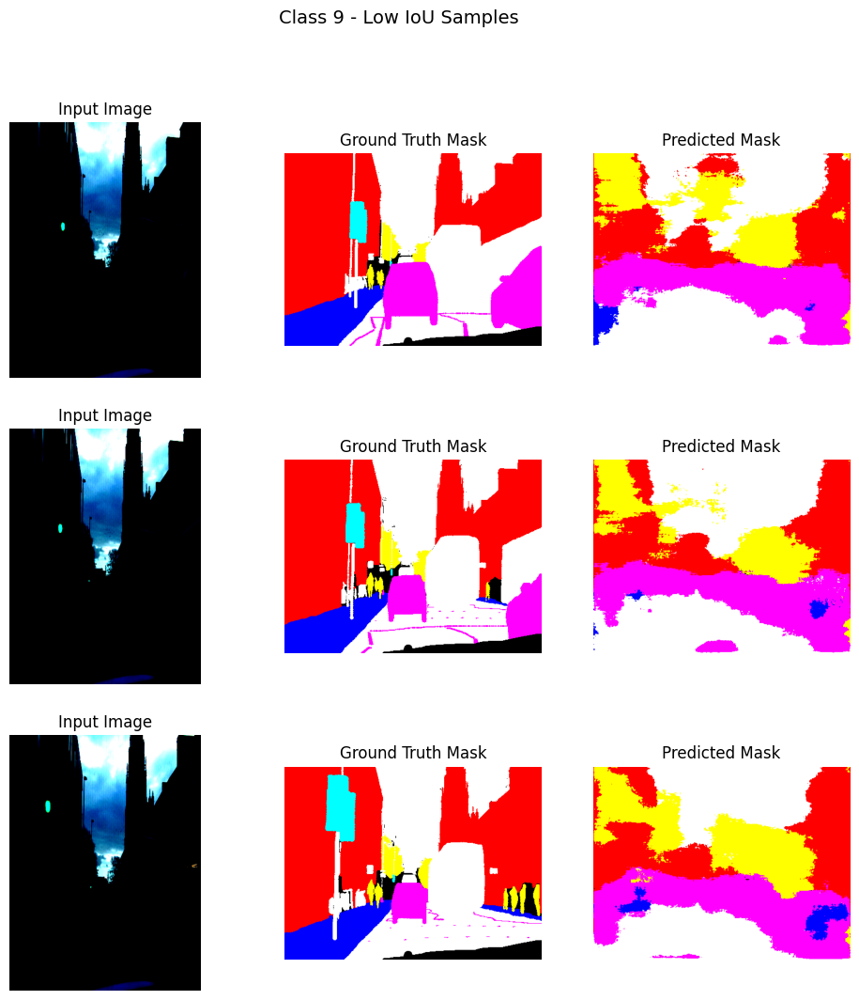

LaneMkgsDriv


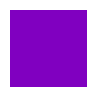

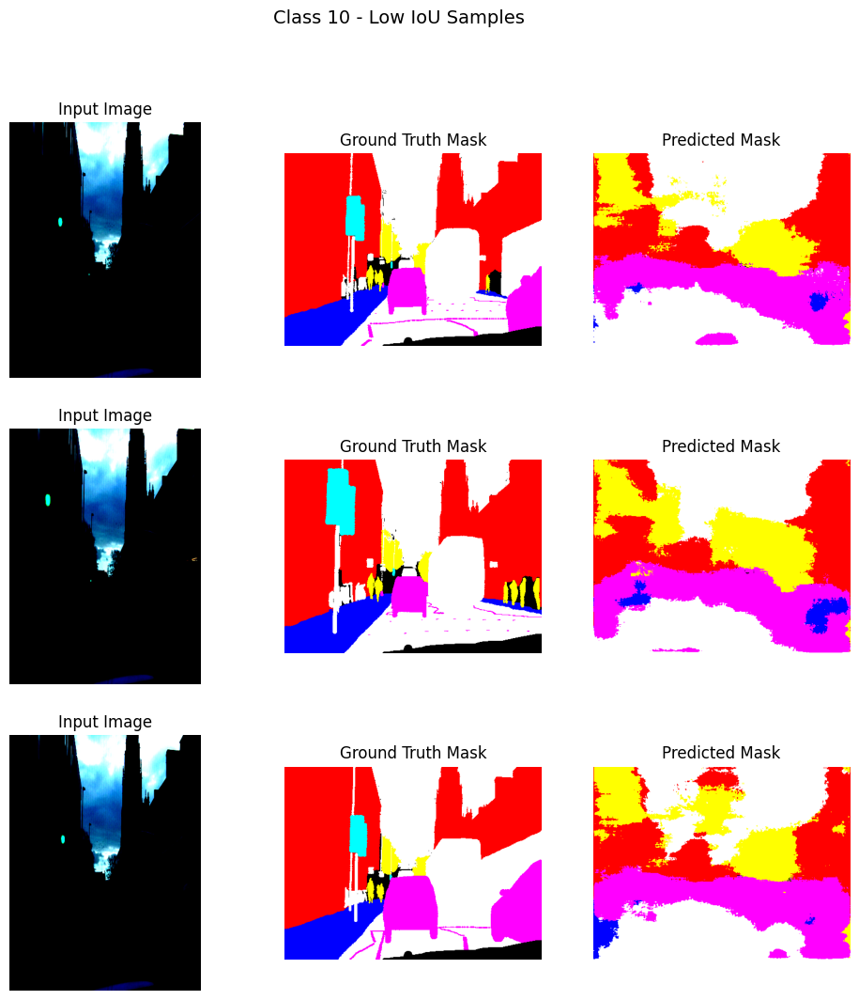

LaneMkgsNonDriv


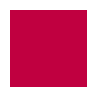

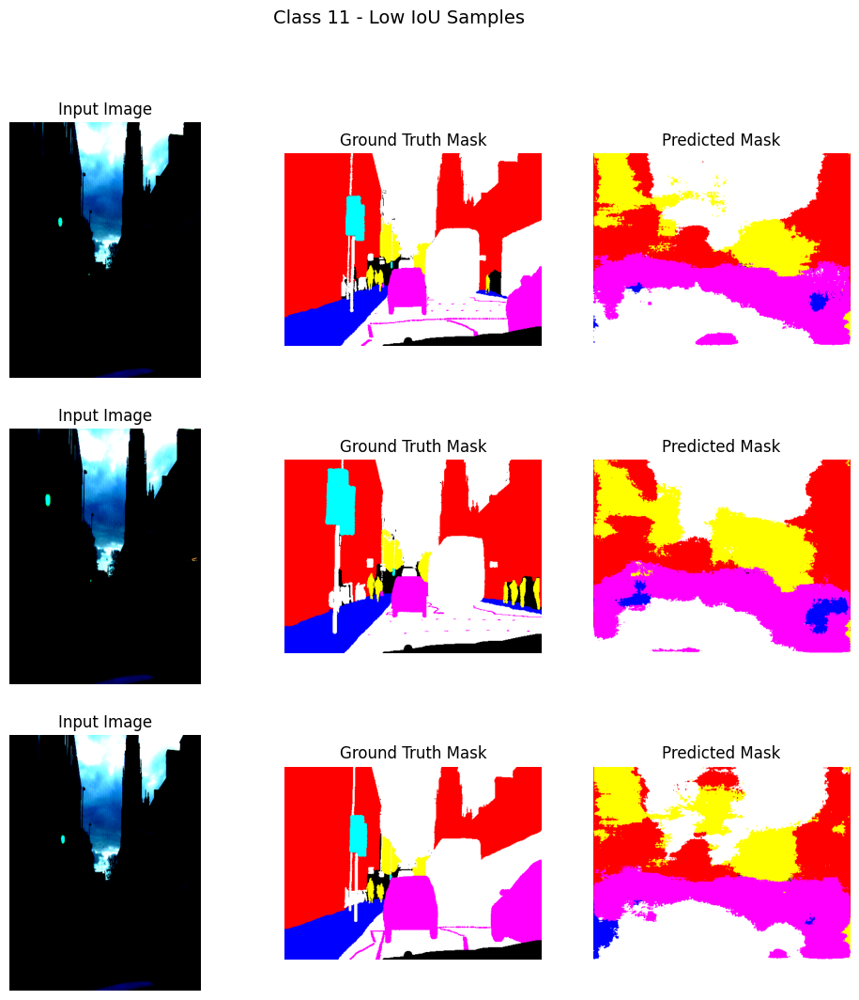

Misc_Text


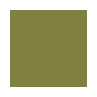

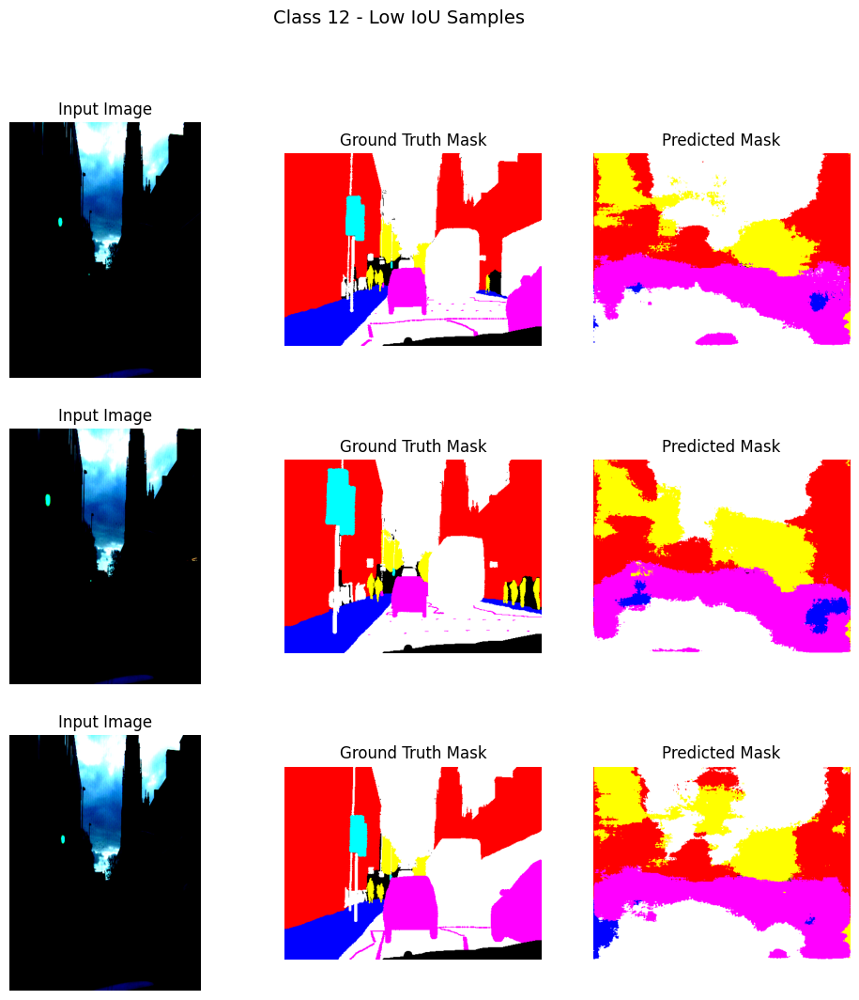

MotorcycleScooter


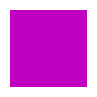

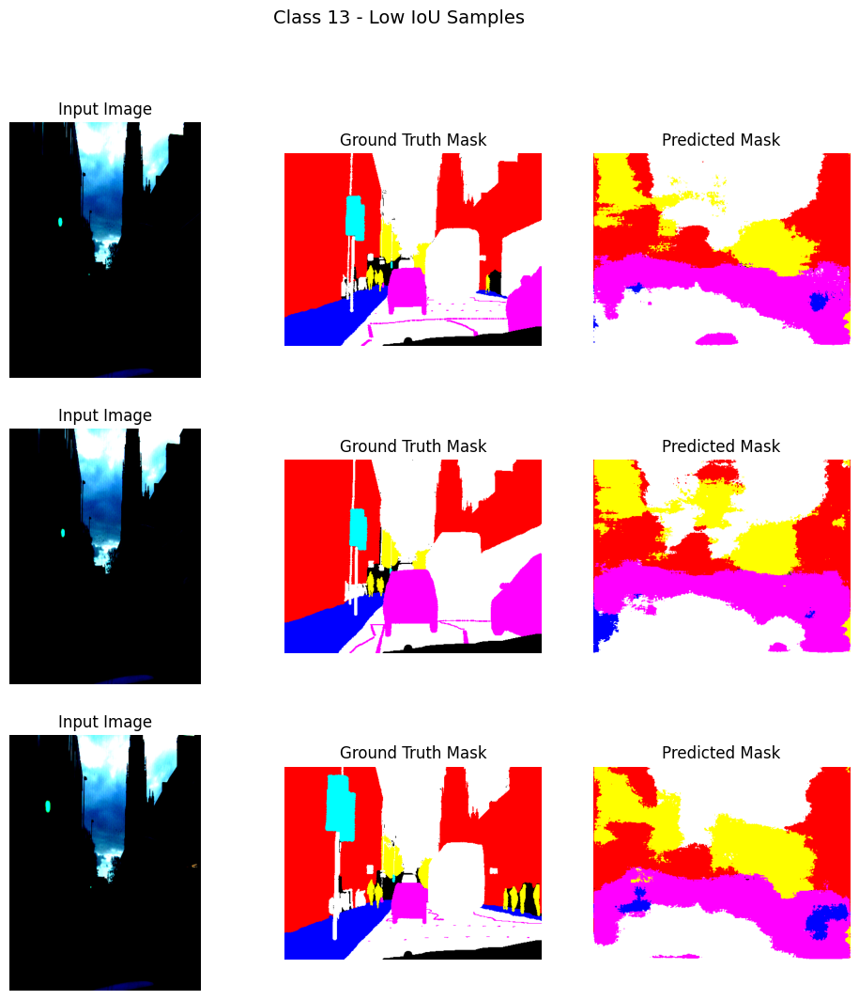

OtherMoving


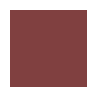

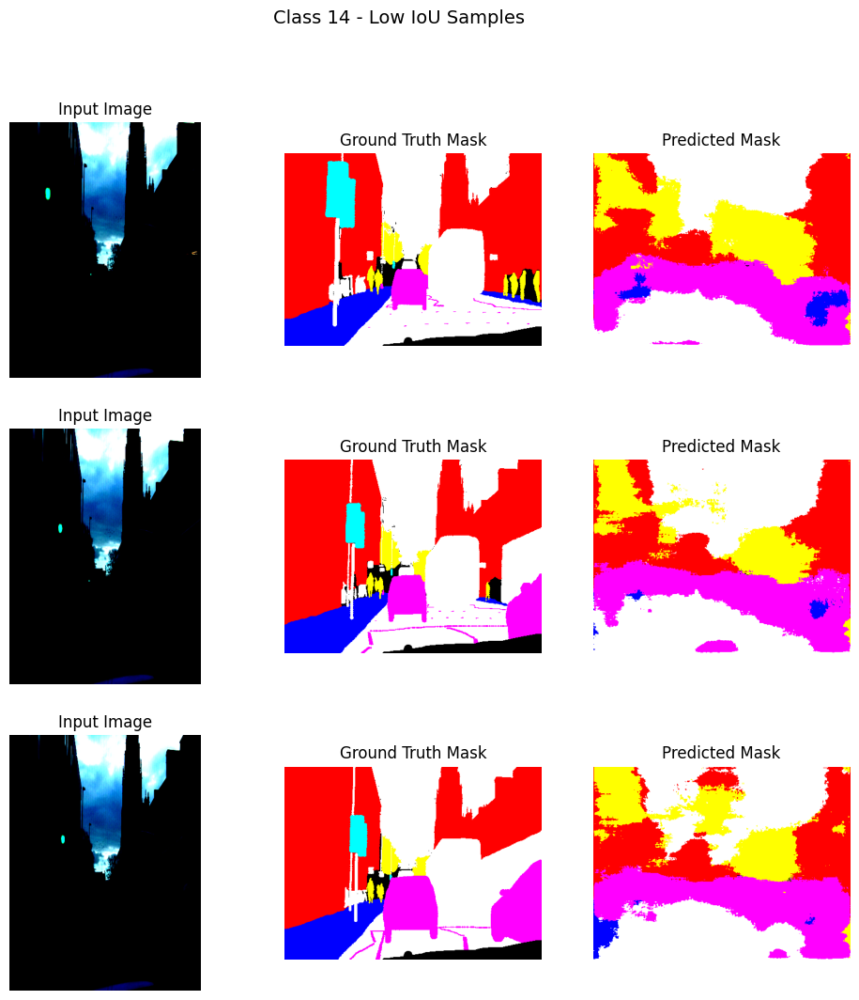

ParkingBlock


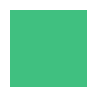

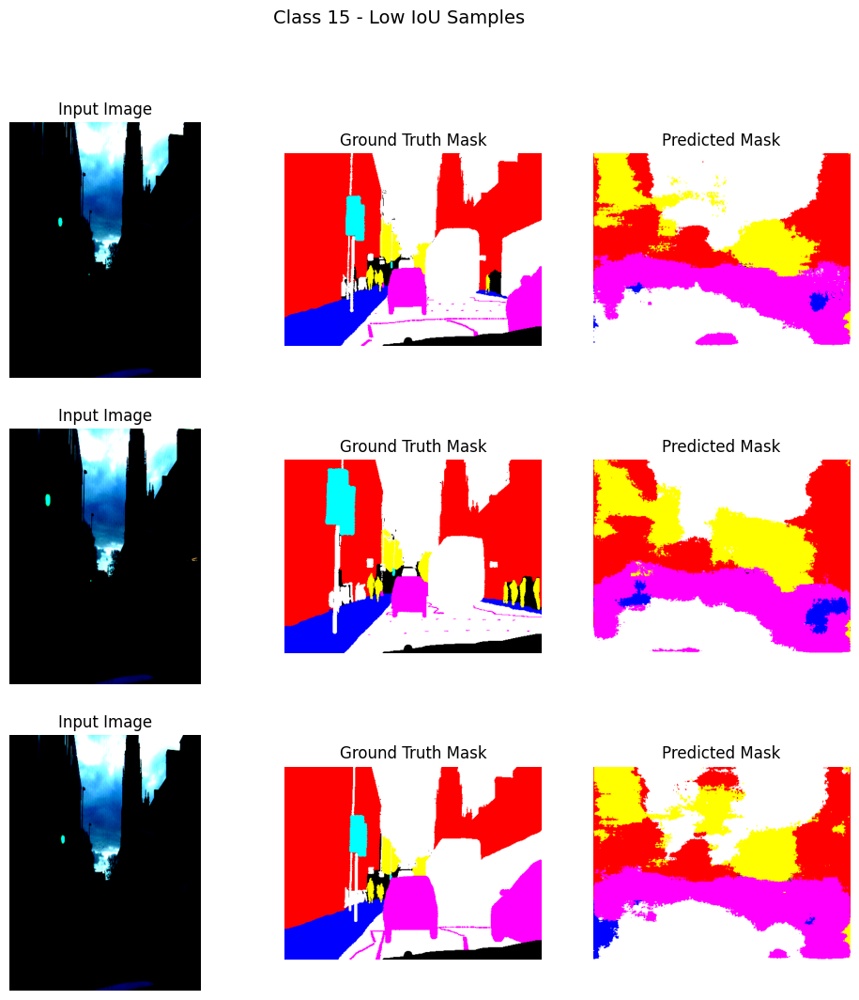

Pedestrian


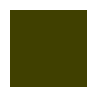

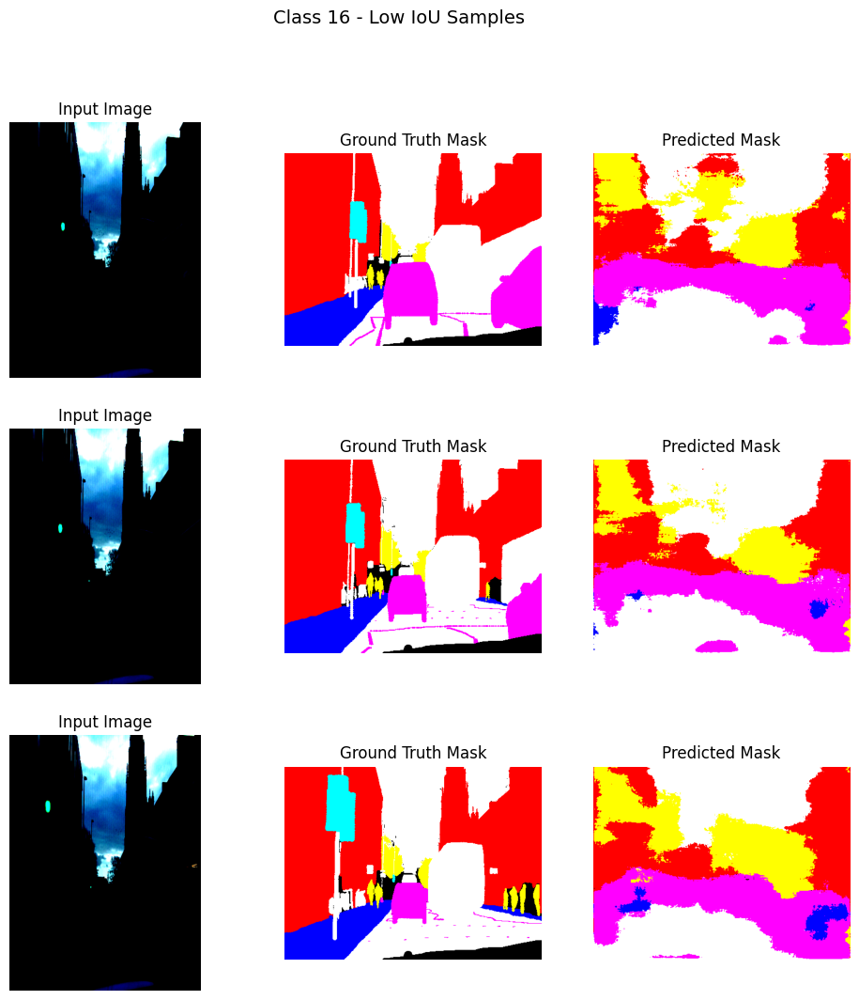

Road


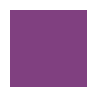

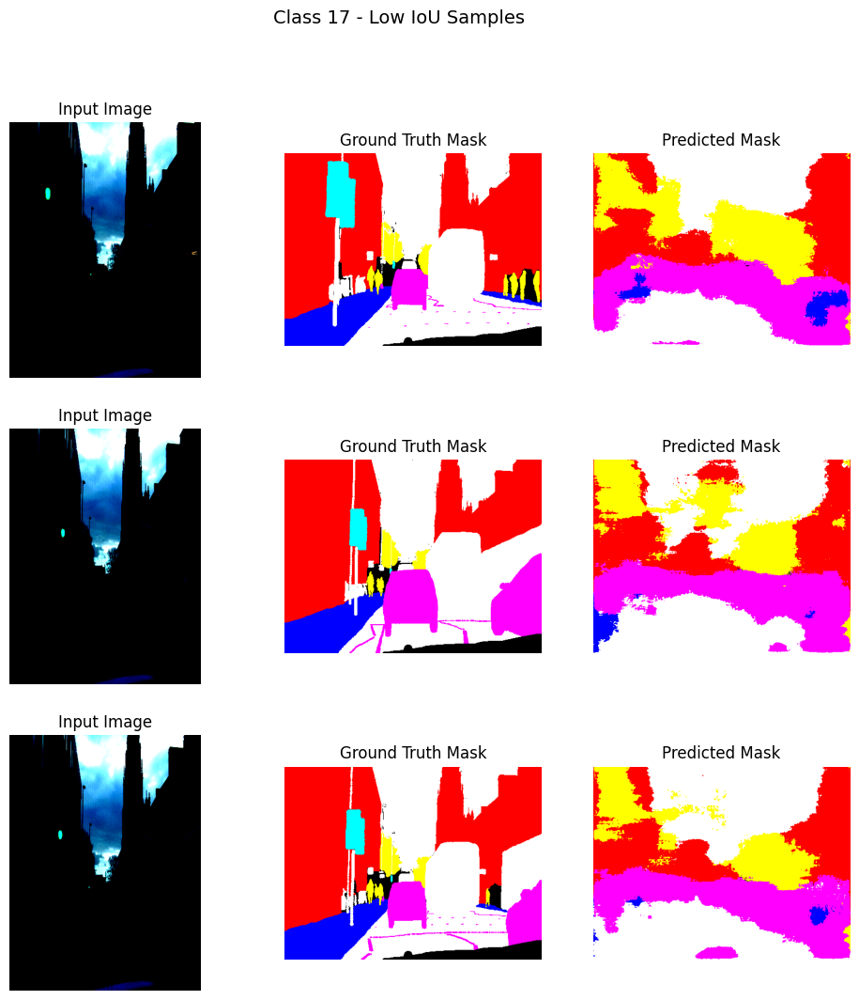

RoadShoulder


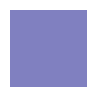

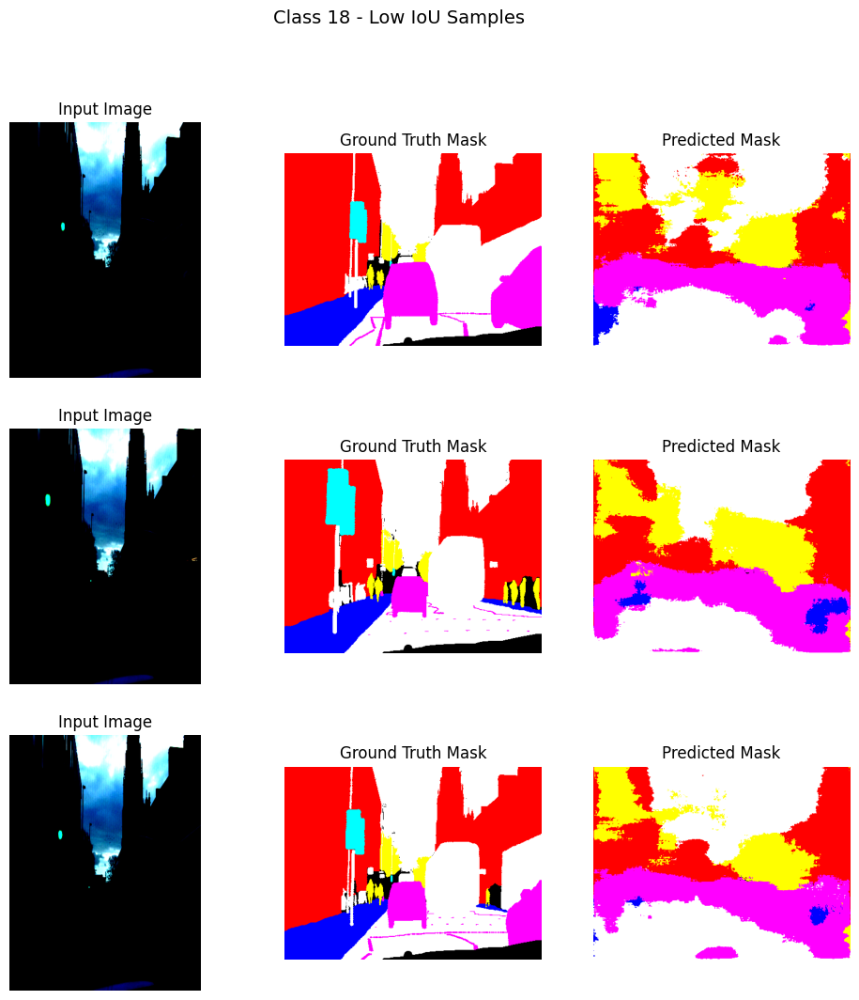

Sidewalk


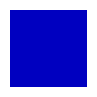

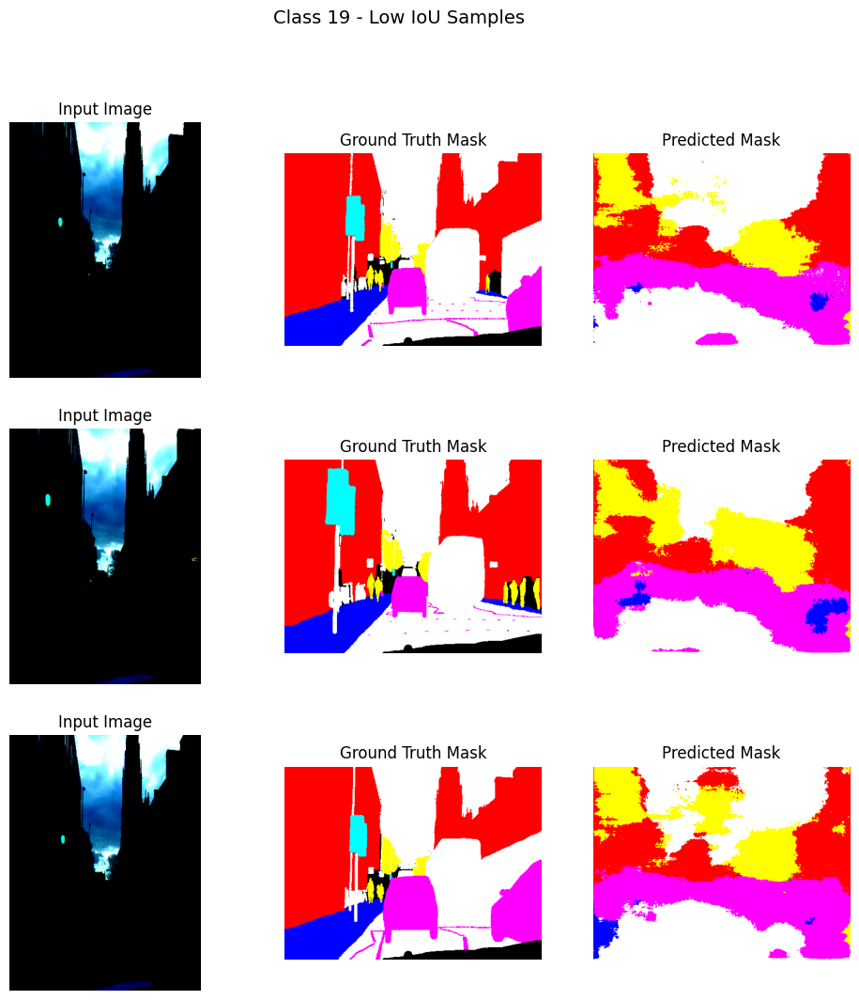

SignSymbol


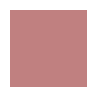

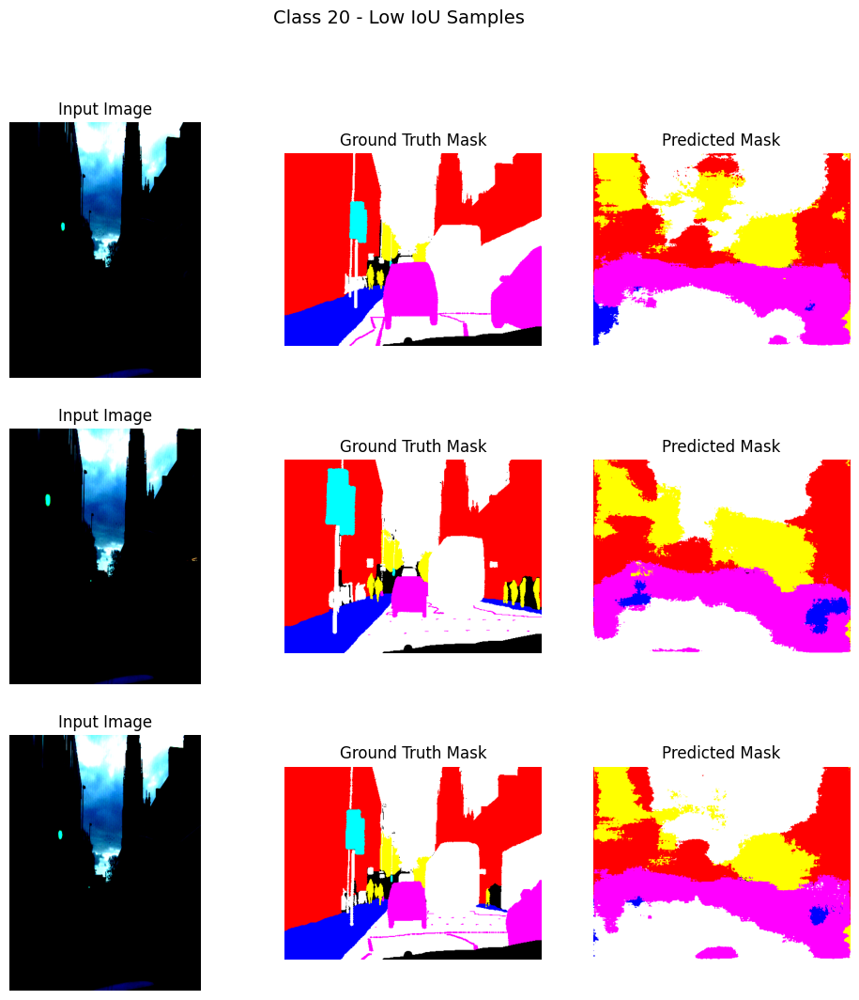

Sky


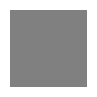

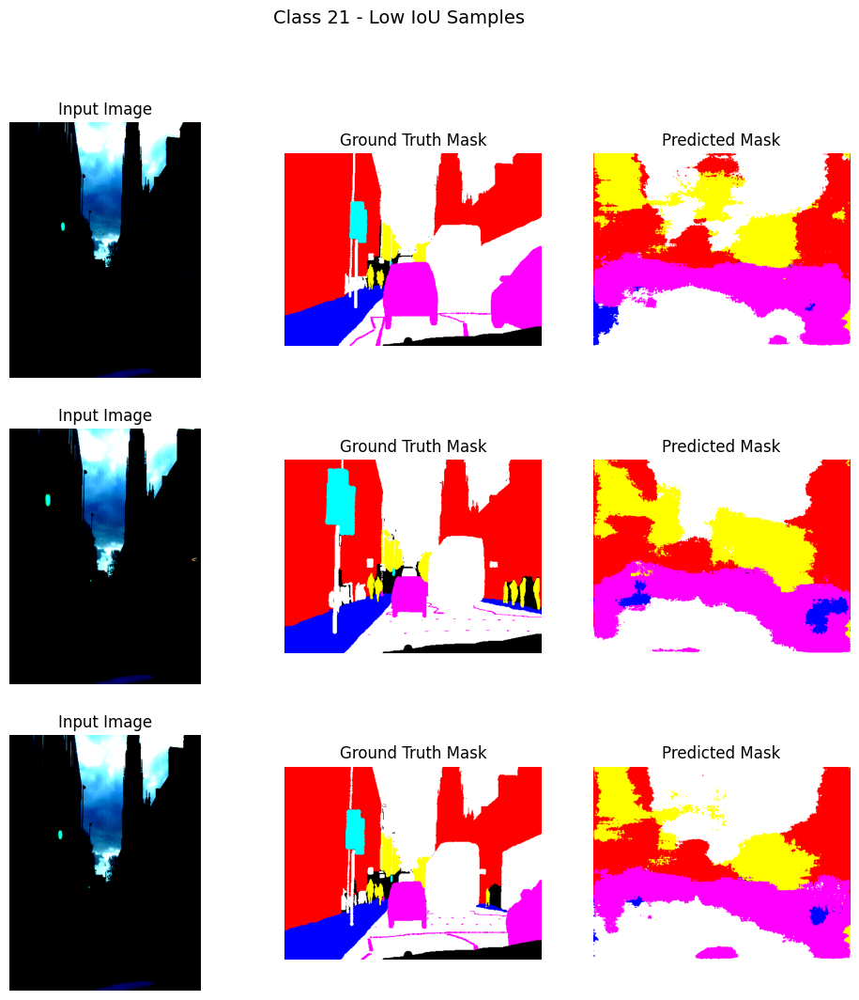

SUVPickupTruck


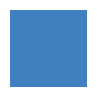

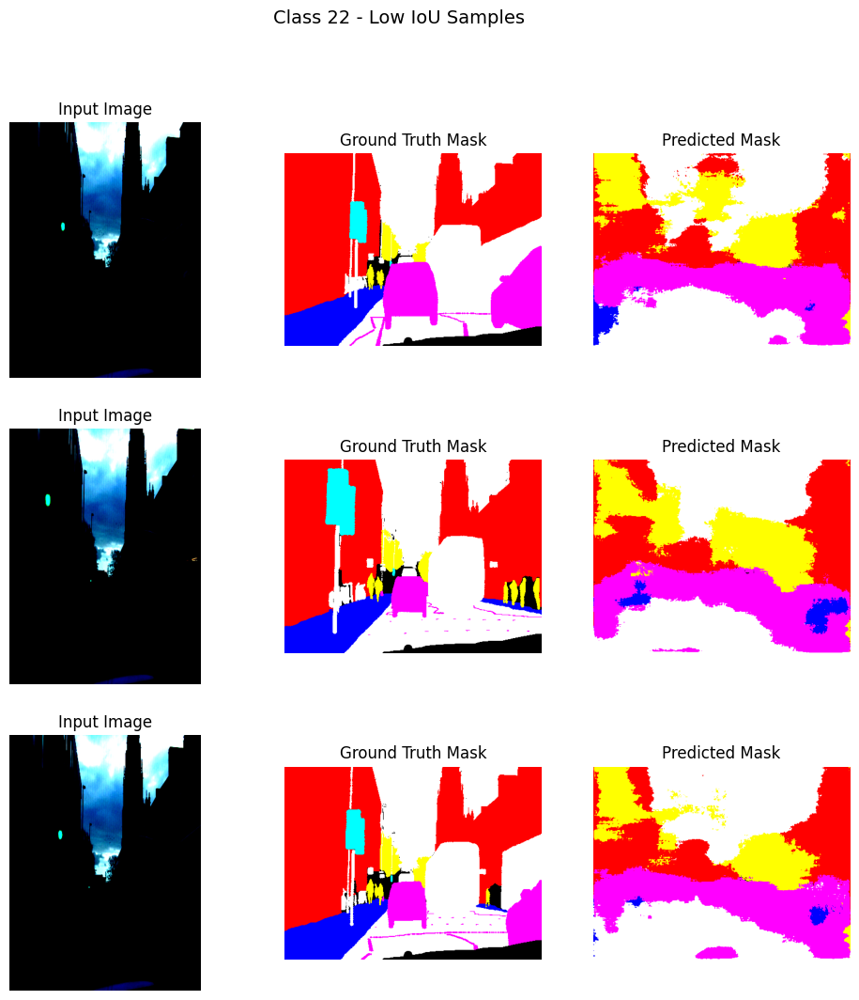

TrafficCone


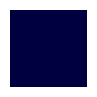

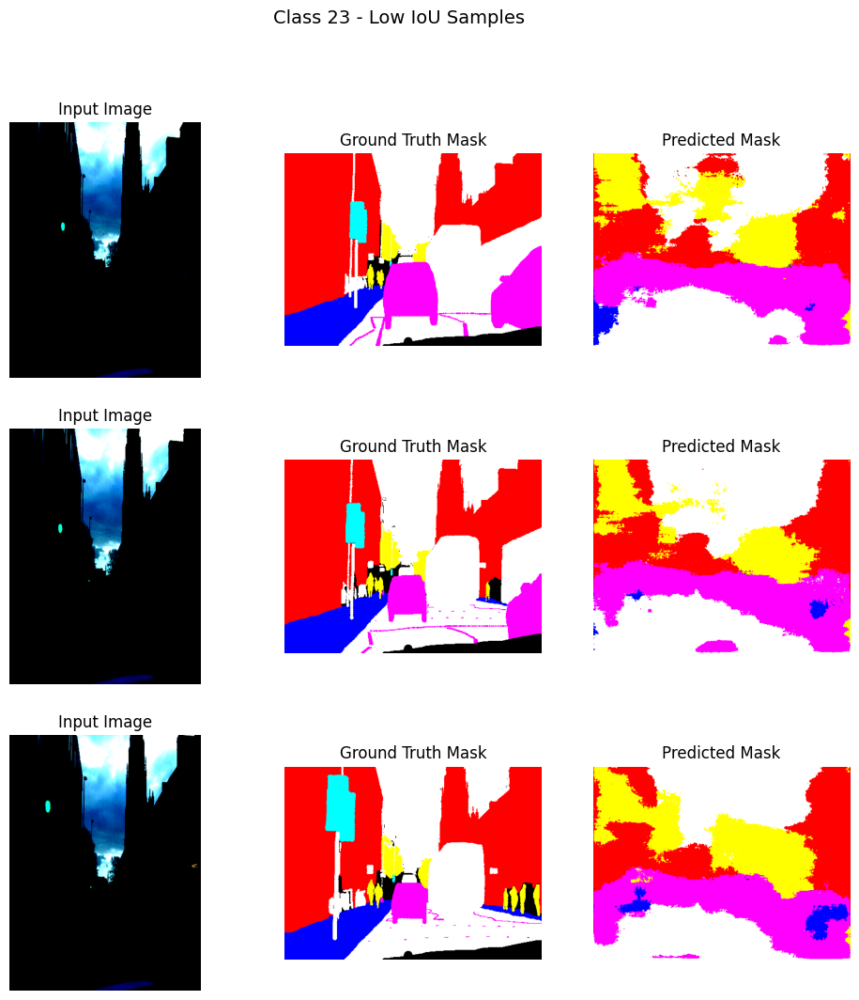

TrafficLight


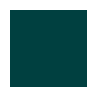

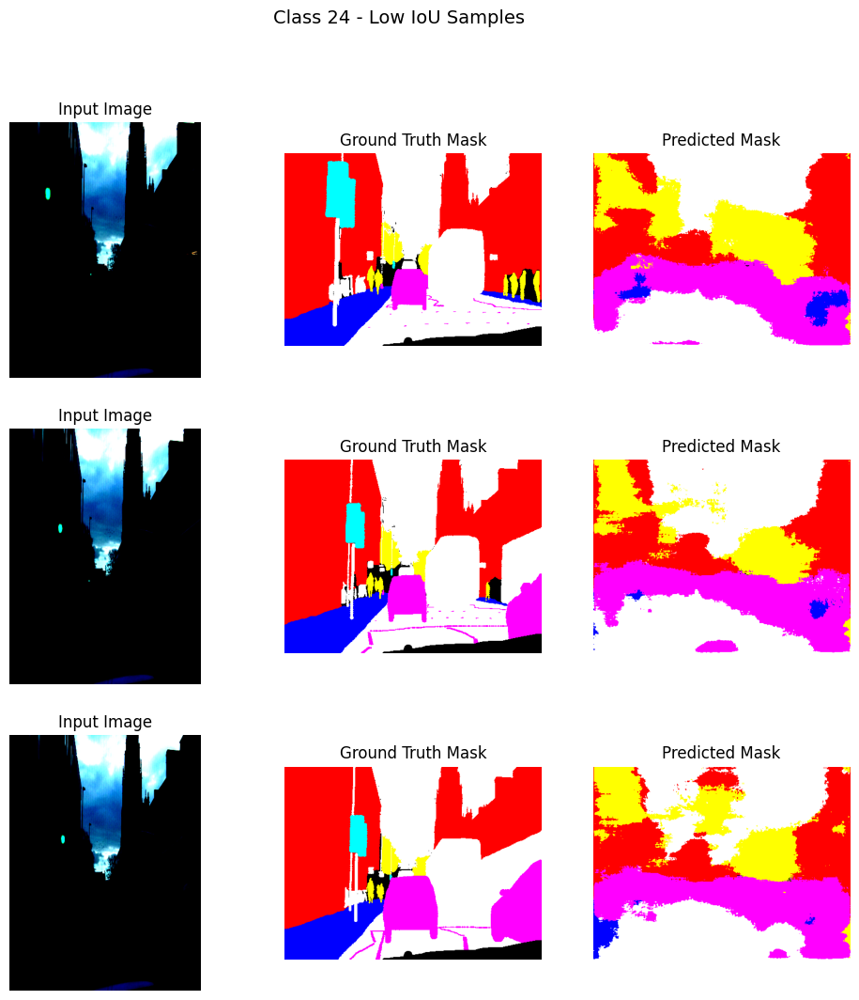

Train


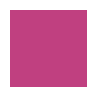

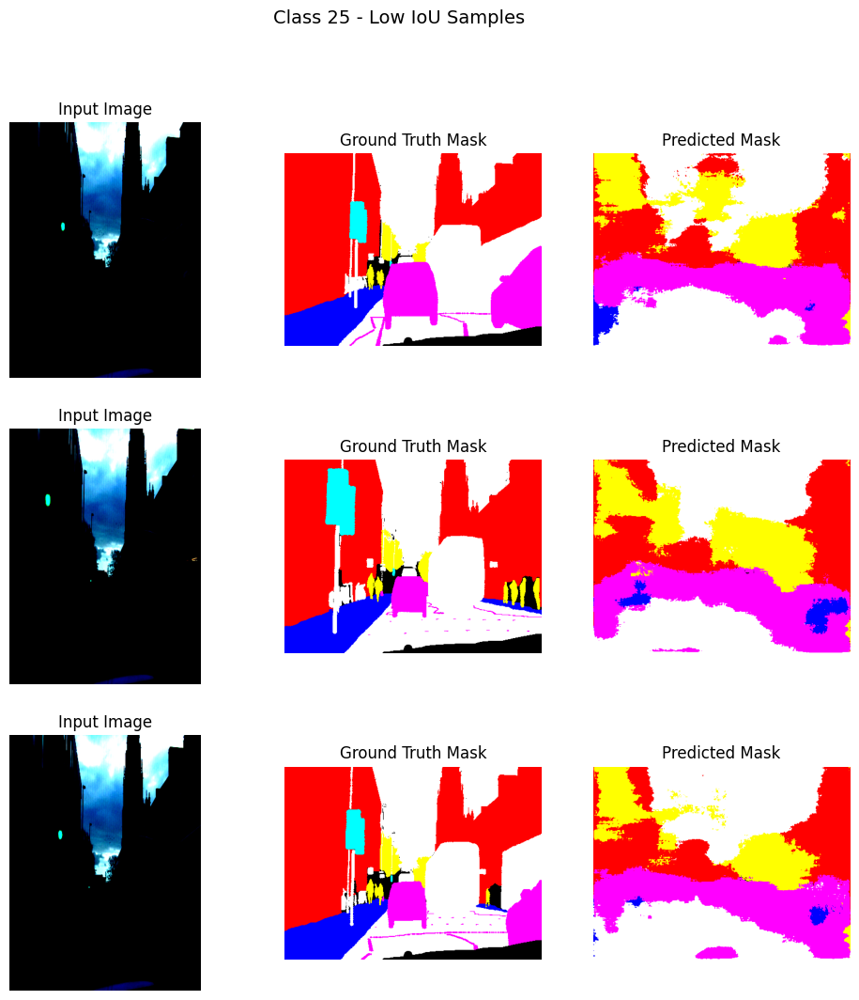

Tree


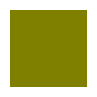

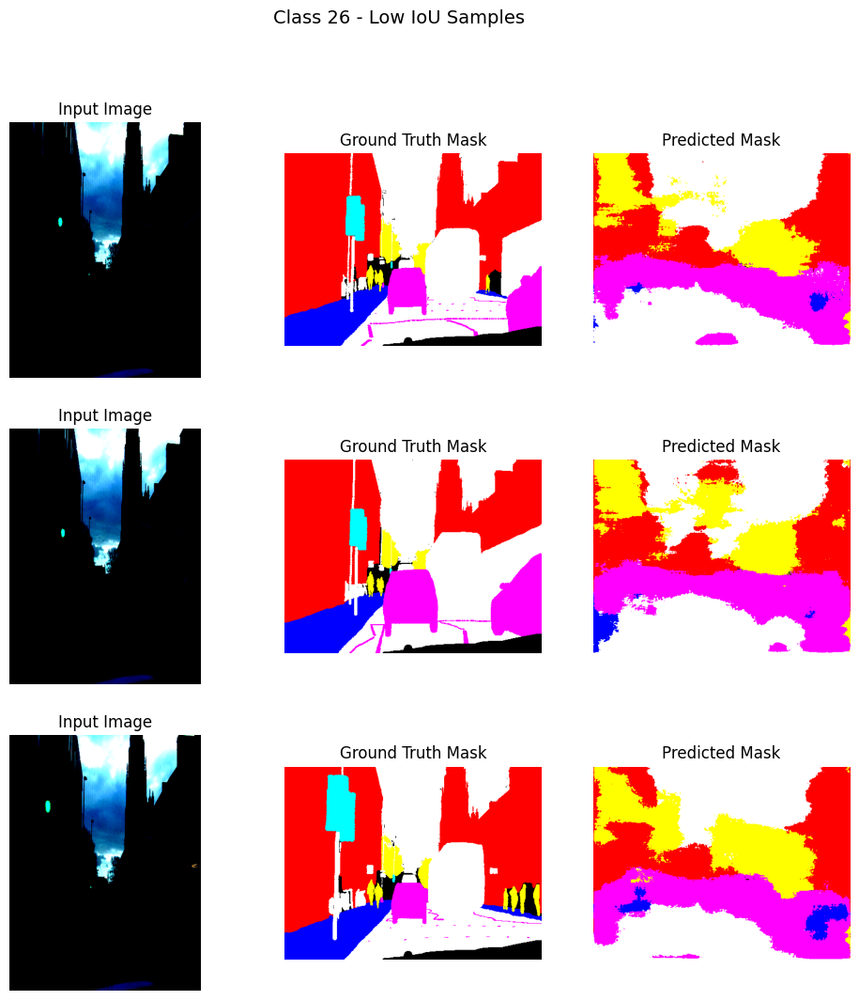

Truck_Bus


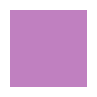

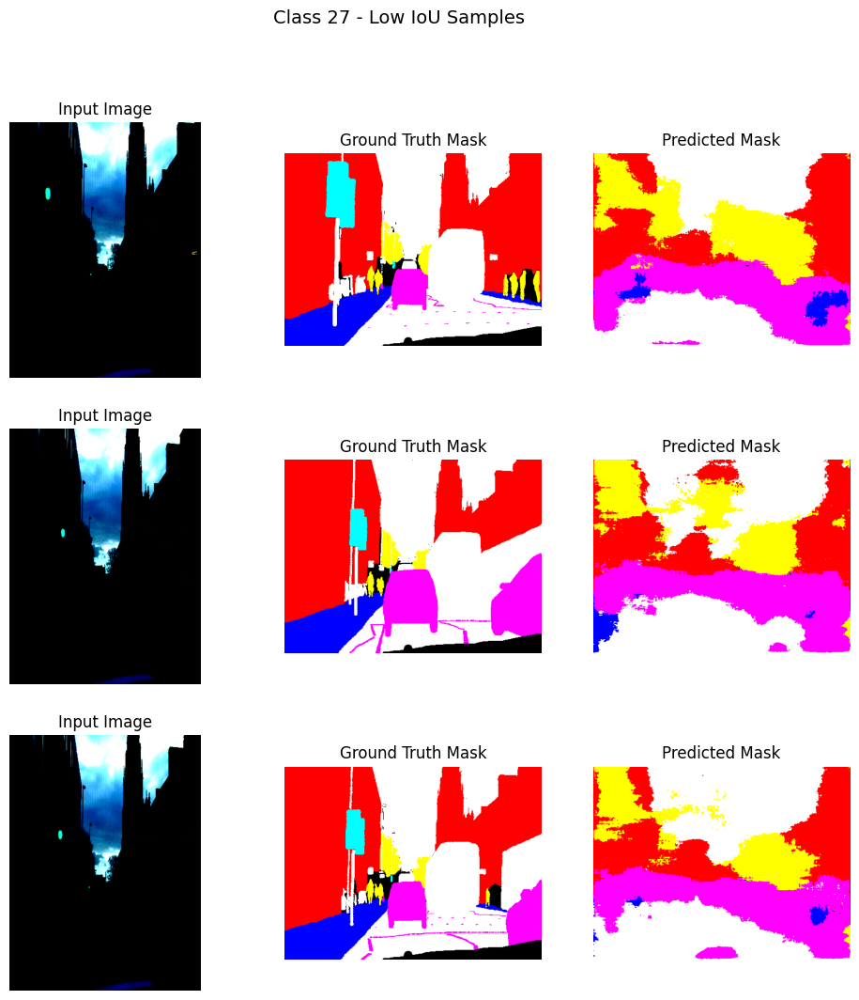

Tunnel


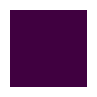

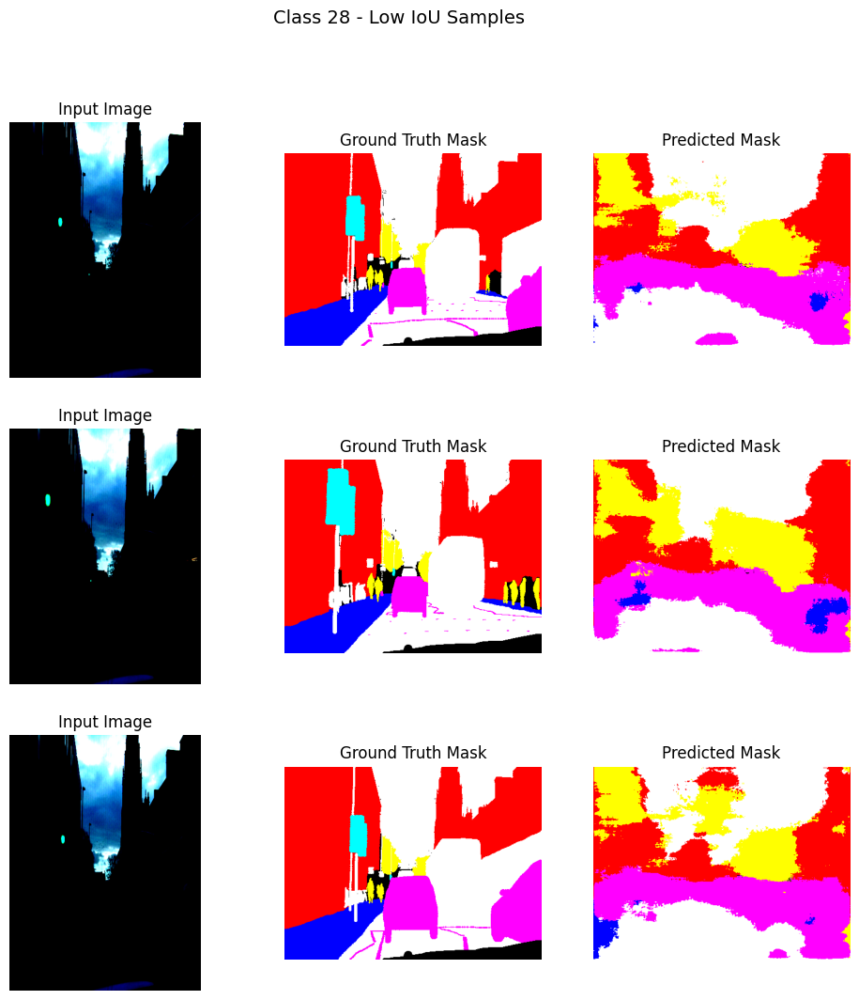

VegetationMisc


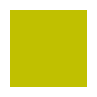

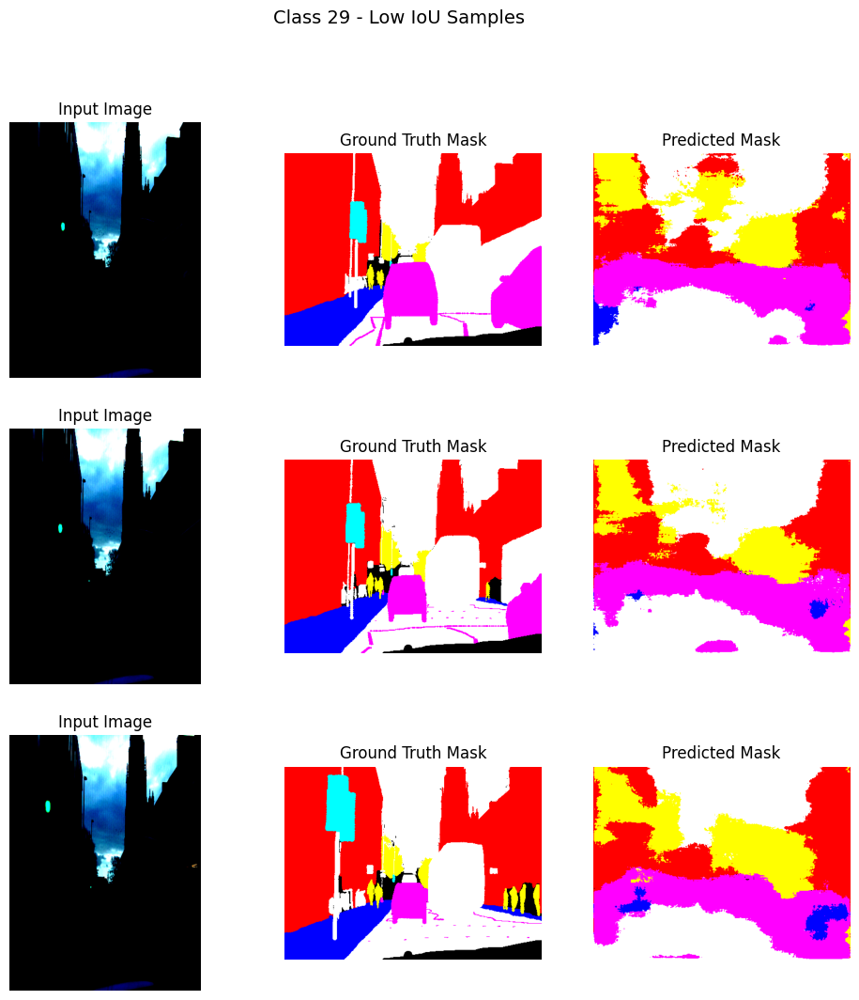

Void


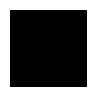

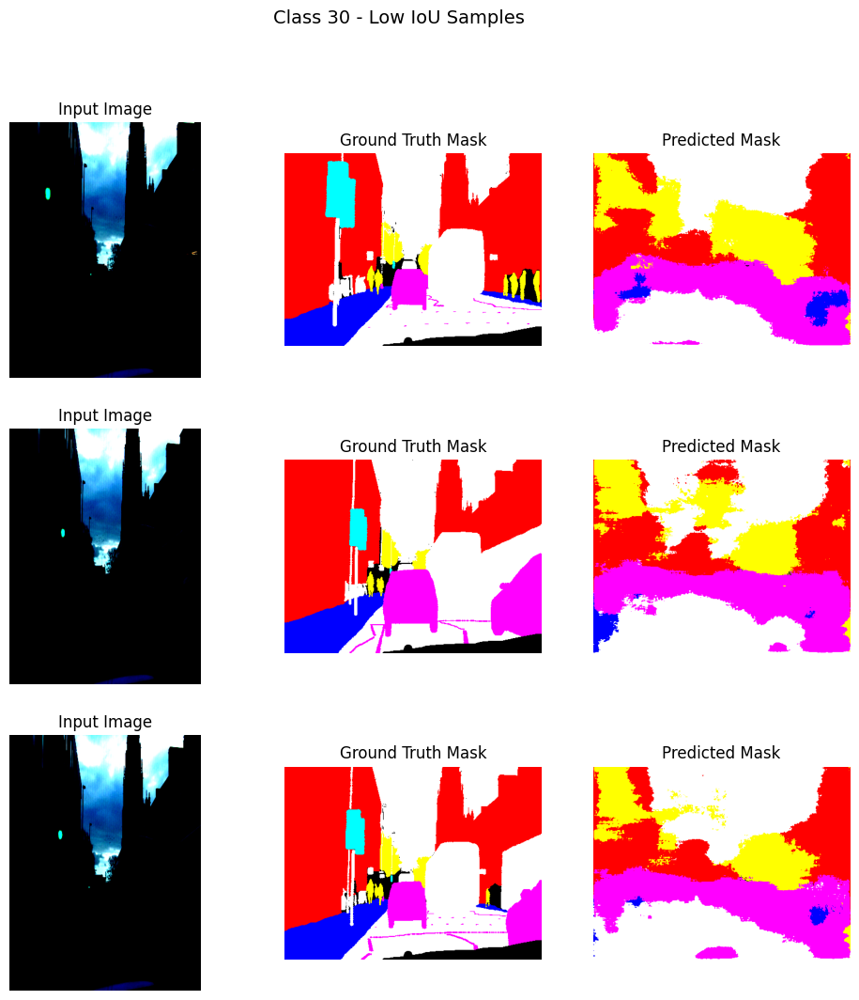

Wall


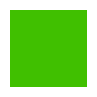

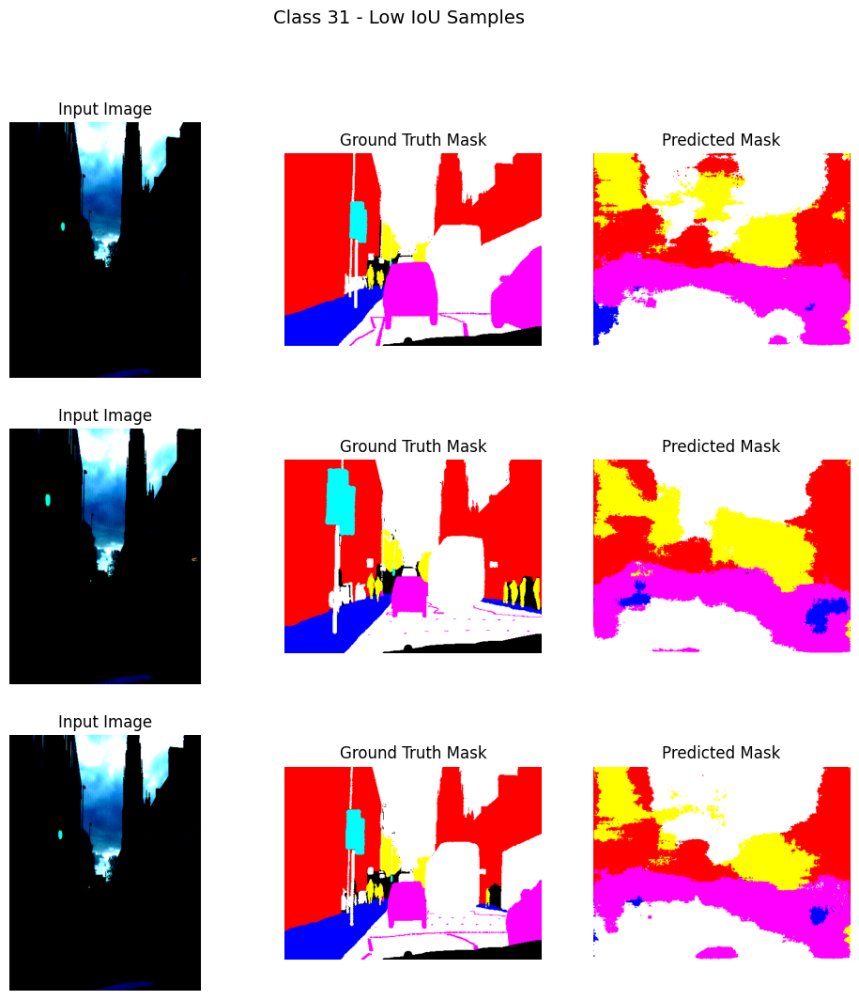

In [34]:
visualize_samples(iou_samples, 32)

In [35]:
deeplab_model = DeepLabV3().to(device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/deeplabv3_resnet50_coco-cd0a2569.pth" to /root/.cache/torch/hub/checkpoints/deeplabv3_resnet50_coco-cd0a2569.pth
100%|██████████| 161M/161M [00:01<00:00, 84.7MB/s] 


In [22]:
wandb.init(project="deeplabv3_training")

In [23]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(deeplab_model.parameters(), lr=learning_rate)

In [24]:
%%time

deeplab_model.train()

for epoch in range(40):
    epoch_loss = 0.0
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        # print(1)
        optimizer.zero_grad()
        outputs = deeplab_model(images)
        # print(2)
        loss = criterion(outputs, labels)
        # print(3)
        loss.backward()
        # print(4)
        optimizer.step()
        
        epoch_loss += loss.item()
    
    avg_loss = epoch_loss / len(train_loader)
    wandb.log({"Epoch": epoch + 1, "Loss": avg_loss})
    print(f"Epoch {epoch+1}/{40}, Loss: {avg_loss:.4f}")

Epoch 1/40, Loss: 1.3662
Epoch 2/40, Loss: 1.0826
Epoch 3/40, Loss: 1.0114
Epoch 4/40, Loss: 0.9340
Epoch 5/40, Loss: 0.8985
Epoch 6/40, Loss: 0.8279
Epoch 7/40, Loss: 0.8164
Epoch 8/40, Loss: 0.7609
Epoch 9/40, Loss: 0.7356
Epoch 10/40, Loss: 0.7066
Epoch 11/40, Loss: 0.6689
Epoch 12/40, Loss: 0.6438
Epoch 13/40, Loss: 0.6140
Epoch 14/40, Loss: 0.5975
Epoch 15/40, Loss: 0.5835
Epoch 16/40, Loss: 0.5409
Epoch 17/40, Loss: 0.5267
Epoch 18/40, Loss: 0.4977
Epoch 19/40, Loss: 0.4714
Epoch 20/40, Loss: 0.4603
Epoch 21/40, Loss: 0.4330
Epoch 22/40, Loss: 0.4095
Epoch 23/40, Loss: 0.3906
Epoch 24/40, Loss: 0.3700
Epoch 25/40, Loss: 0.3586
Epoch 26/40, Loss: 0.3403
Epoch 27/40, Loss: 0.3230
Epoch 28/40, Loss: 0.3149
Epoch 29/40, Loss: 0.3039
Epoch 30/40, Loss: 0.2934
Epoch 31/40, Loss: 0.2836
Epoch 32/40, Loss: 0.2779
Epoch 33/40, Loss: 0.2659
Epoch 34/40, Loss: 0.2654
Epoch 35/40, Loss: 0.2535
Epoch 36/40, Loss: 0.2474
Epoch 37/40, Loss: 0.2377
Epoch 38/40, Loss: 0.2315
Epoch 39/40, Loss: 0.

In [25]:
wandb.finish()

Epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
Loss,█▆▆▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
Epoch,40
Loss,0.22255


In [31]:
torch.save(deeplab_model.state_dict(), "deeplabv3.pth")

In [ ]:
while True:
    pass

In [36]:
deeplab_model = DeepLabV3().to(device)
deeplab_model.load_state_dict(torch.load("/kaggle/input/camvid/deeplabv3.pth", weights_only=True))

<All keys matched successfully>

In [37]:
torch.cuda.empty_cache()

In [38]:
deeplab_metrics, iou_samples = evaluate_segnet(deeplab_model, test_loader)

Batch: 0
Batch: 1
Batch: 2
Batch: 3
Batch: 4
Batch: 5
Batch: 6
Batch: 7
Batch: 8
Batch: 9
Batch: 10
Batch: 11
Batch: 12
Batch: 13
Batch: 14
Batch: 15
Batch: 16
Batch: 17
Batch: 18
Batch: 19
Batch: 20
Batch: 21
Batch: 22
Batch: 23
Batch: 24
Batch: 25
Batch: 26
Batch: 27
Batch: 28
Batch: 29
Batch: 30
Batch: 31
Batch: 32
Batch: 33
Batch: 34
Batch: 35
Batch: 36
Batch: 37
Batch: 38
Batch: 39
Batch: 40
Batch: 41
Batch: 42
Batch: 43
Batch: 44
Batch: 45
Batch: 46
Batch: 47
Batch: 48
Batch: 49
Batch: 50
Batch: 51
Batch: 52
Batch: 53
Batch: 54
Batch: 55
Batch: 56
Batch: 57
Num Batches: 58


In [46]:
print("Class-wise Metrics:\n")
print("Pixel Accuracy:\n", deeplab_metrics['pixel_acc'])
print("\nDice Coefficient:\n", deeplab_metrics['dice'])
print("\nIoU:\n", deeplab_metrics['iou'])
print("\nMean IoU:", deeplab_metrics['mIoU'])

Class-wise Metrics:

Pixel Accuracy:
 [0.99993821 0.99973664 0.99484794 0.99912154 0.90938917 0.966486
 0.9996538  0.99974831 0.98760823 0.98673731 0.98509788 0.99997281
 0.99462464 0.99981207 0.99678874 0.99615643 0.98723098 0.94412793
 0.99764904 0.96463819 0.99909131 0.95638931 0.98881683 0.99999042
 0.99695684 1.         0.92709194 0.98742799 1.         0.98842231
 0.95671745 0.98219072]

Dice Coefficient:
 [0.         0.00645222 0.08337753 0.00779683 0.71740387 0.46088294
 0.         0.05954339 0.03092904 0.16449333 0.08870939 0.
 0.09002102 0.         0.07536765 0.07327604 0.10761089 0.87756635
 0.03300915 0.53687947 0.05292777 0.86943698 0.08499903 0.
 0.12861831 0.         0.56176247 0.06892371 0.         0.10317588
 0.34297399 0.23134094]

IoU:
 [0.         0.00358847 0.06342907 0.00503741 0.60011898 0.34147477
 0.         0.04302742 0.01699828 0.1244417  0.0558664  0.
 0.0640624  0.         0.05257994 0.04899171 0.06702823 0.78741336
 0.02513299 0.41947599 0.03859929 0.775423

Animal


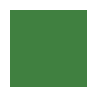

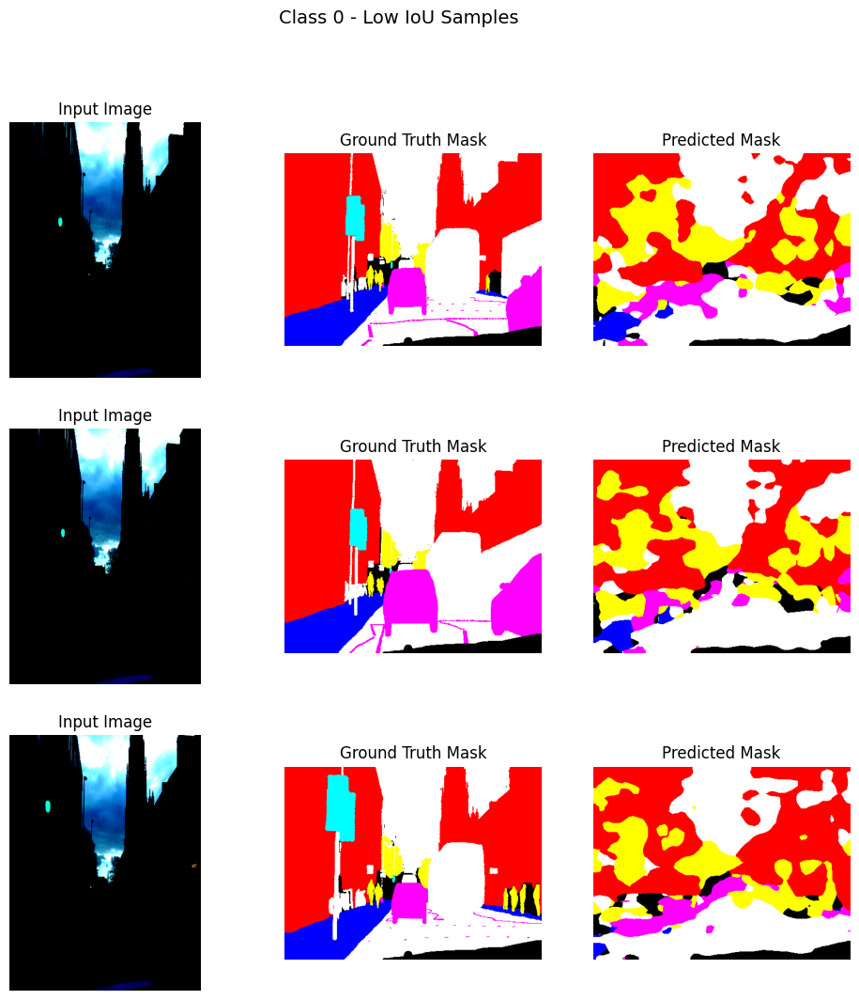

Archway


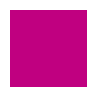

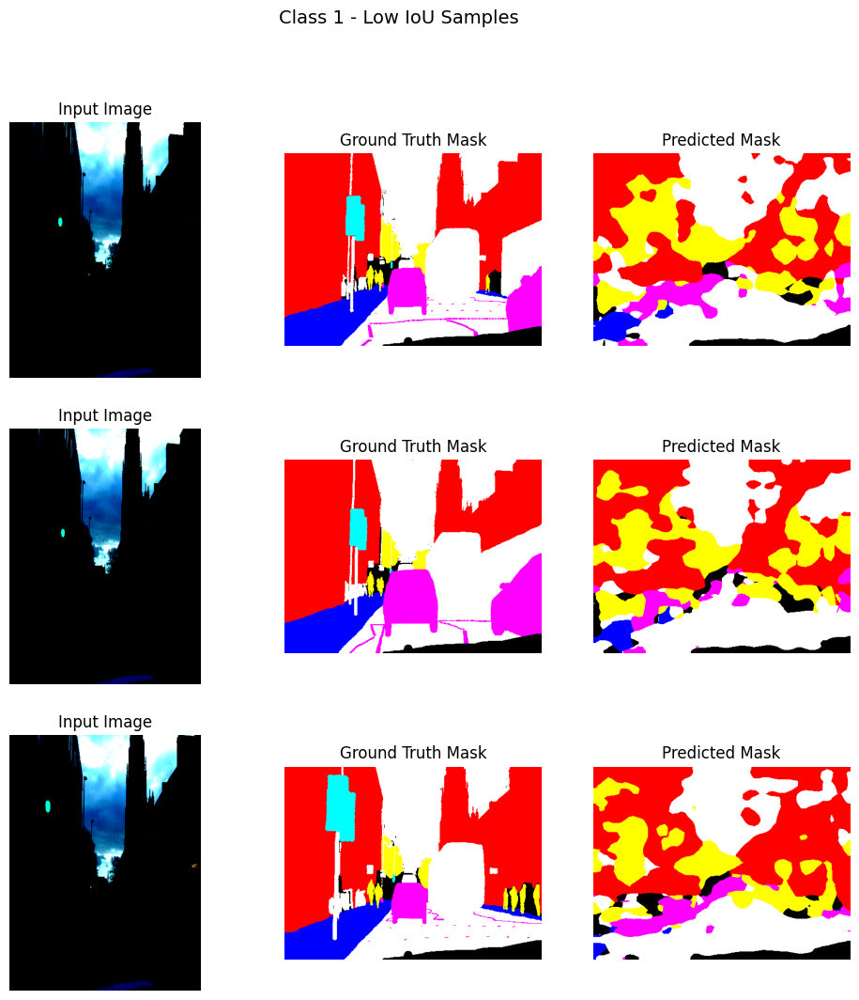

Bicyclist


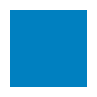

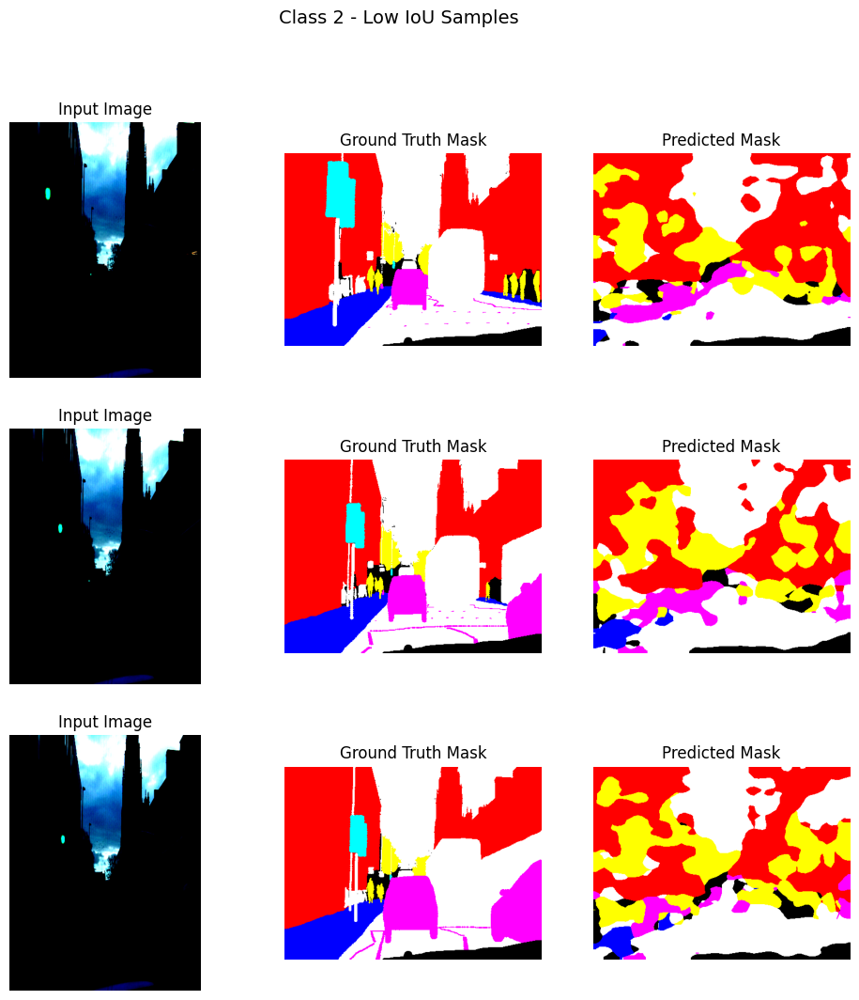

Bridge


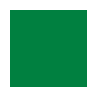

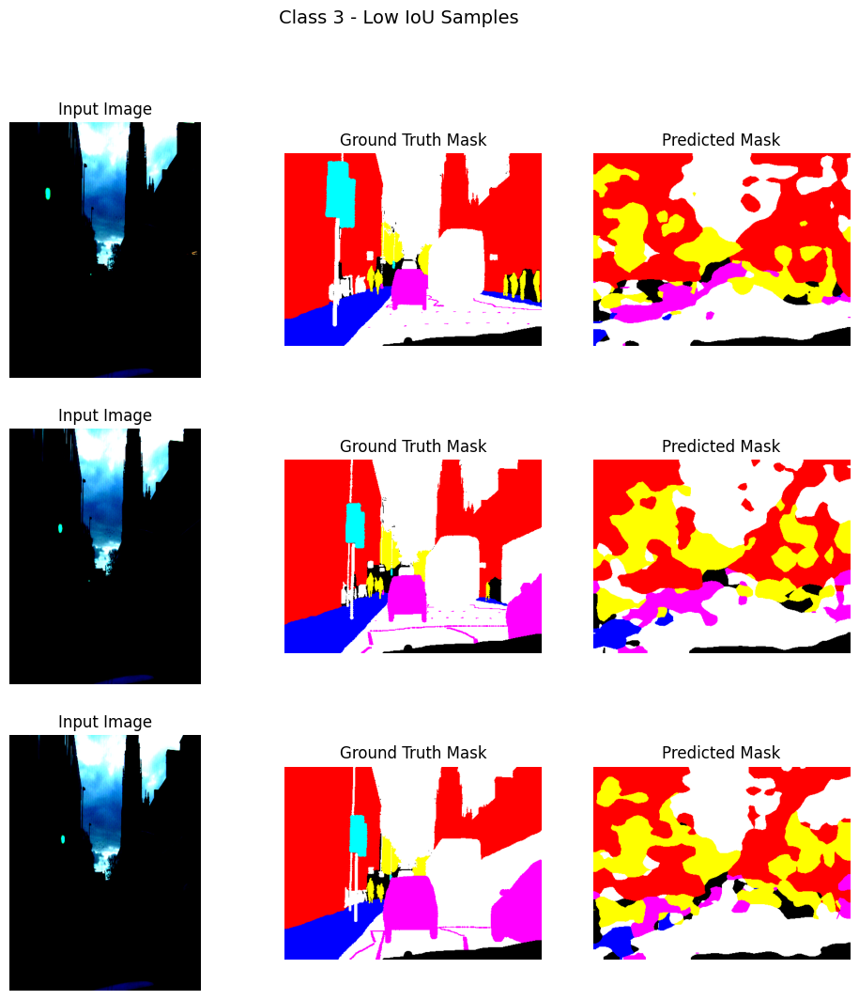

Building


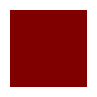

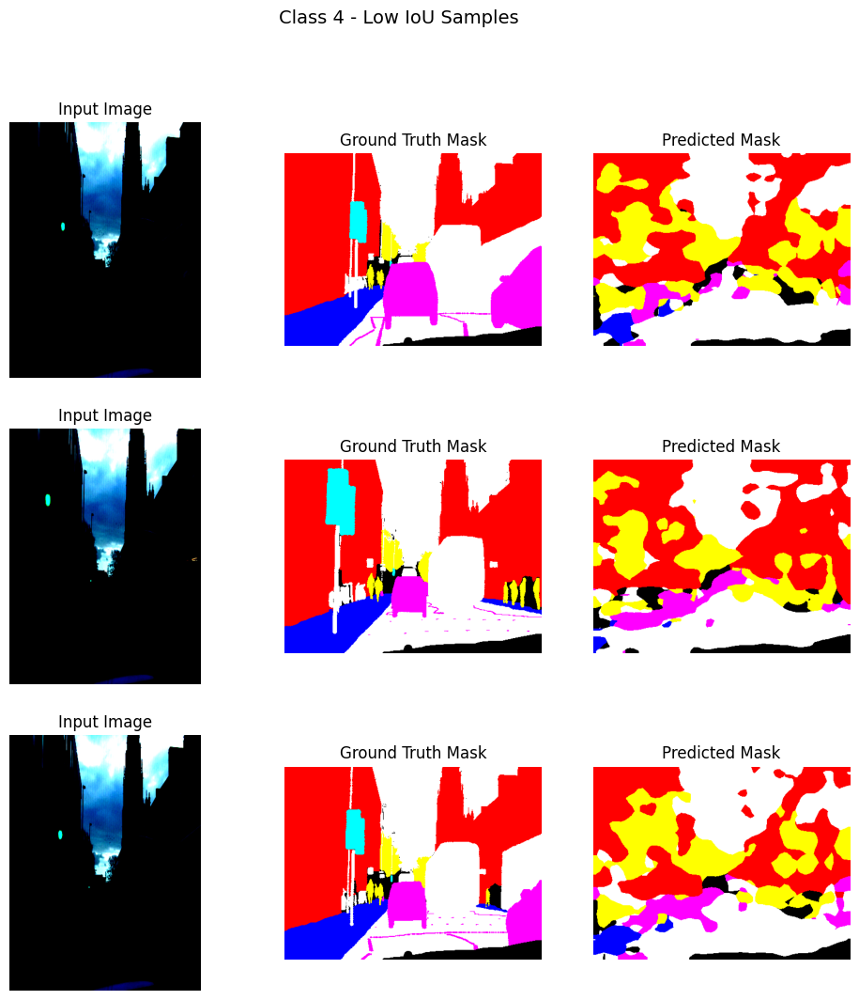

Car


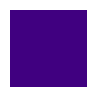

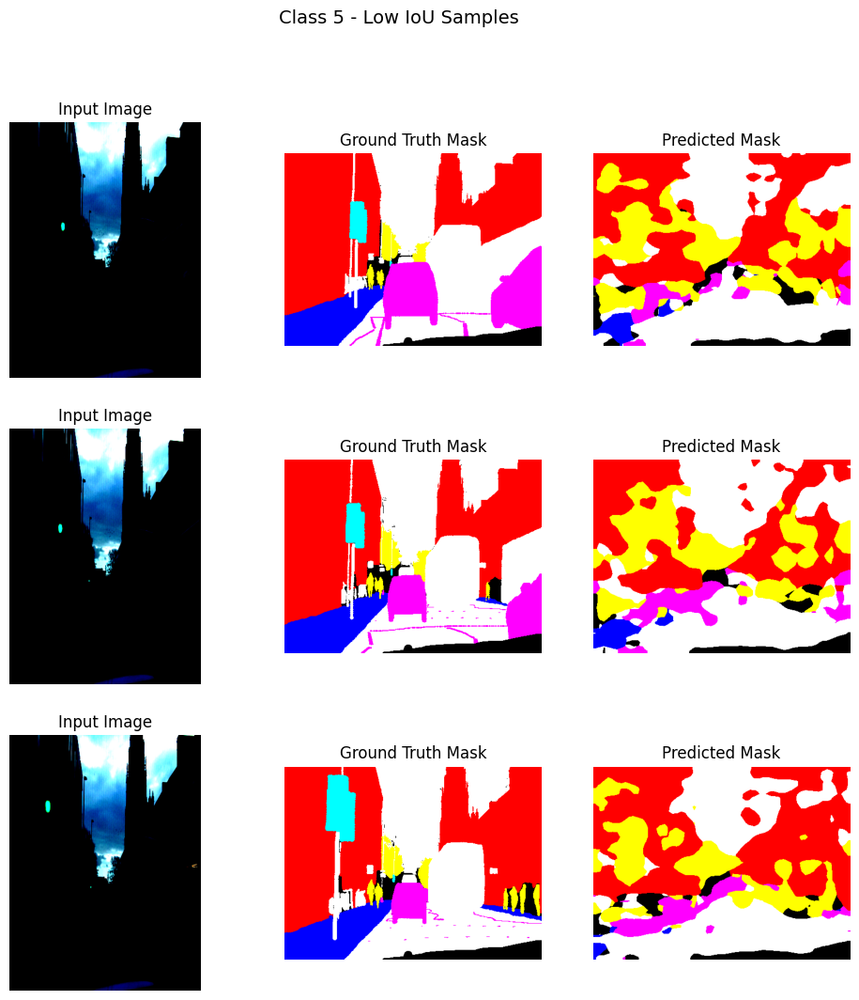

CartLuggagePram


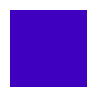

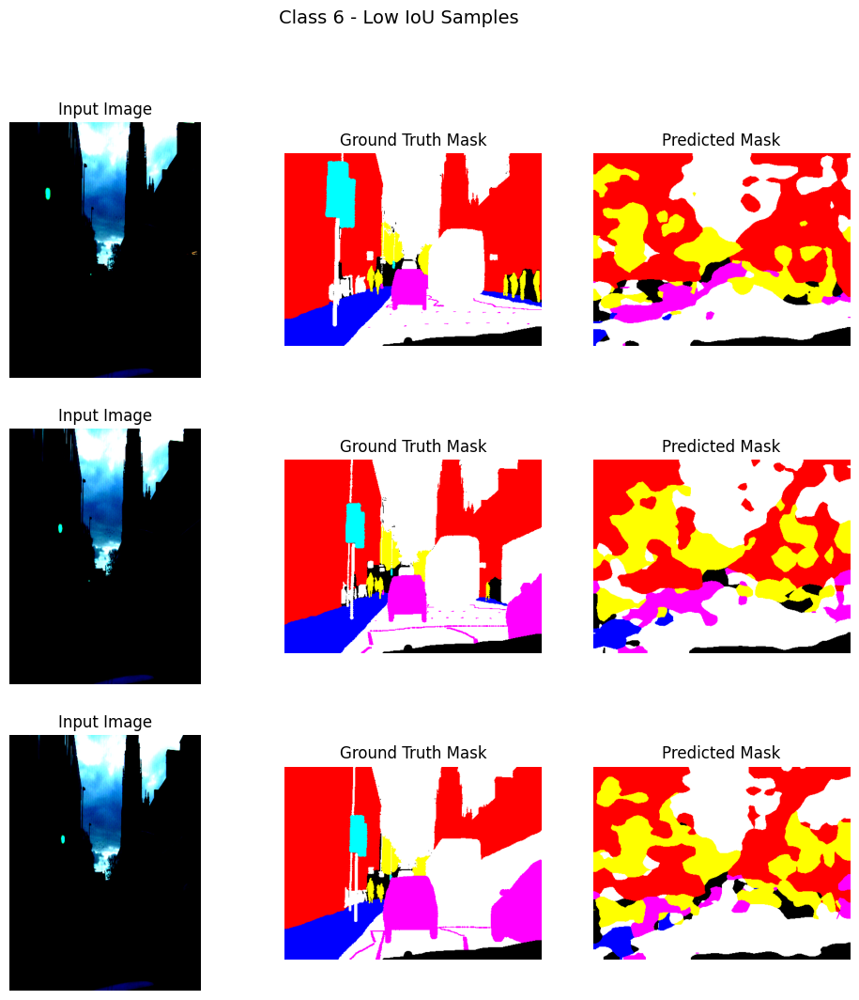

Child


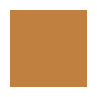

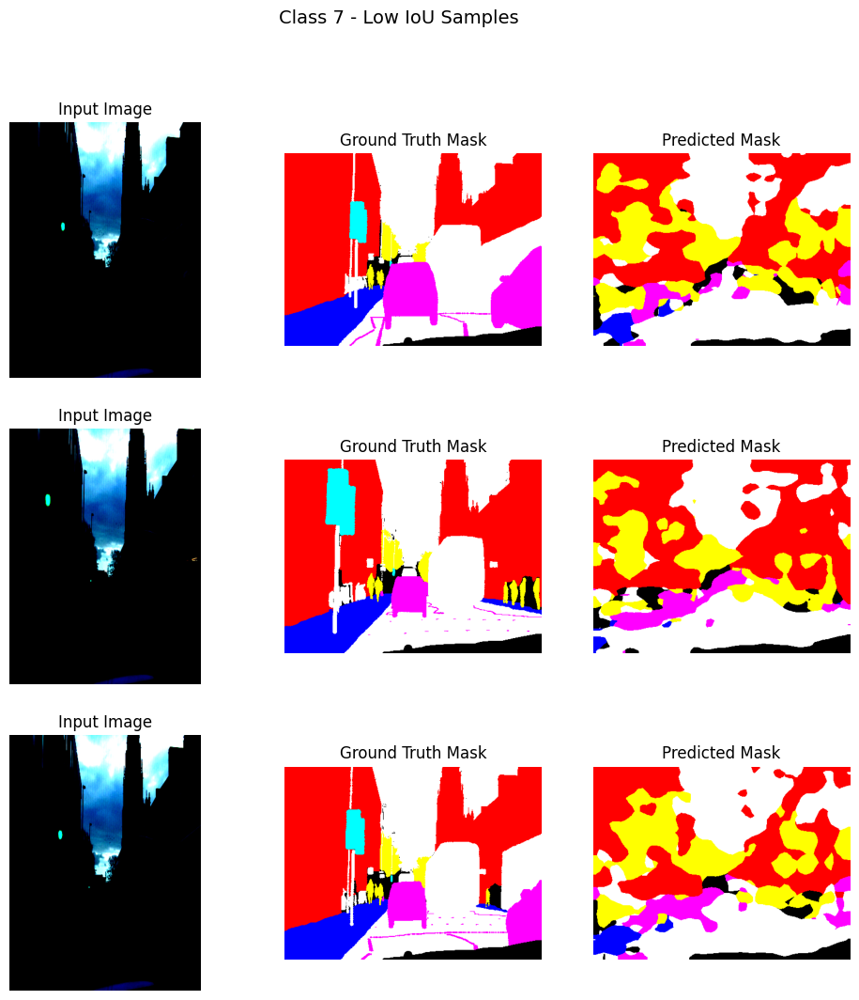

Column_Pole


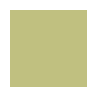

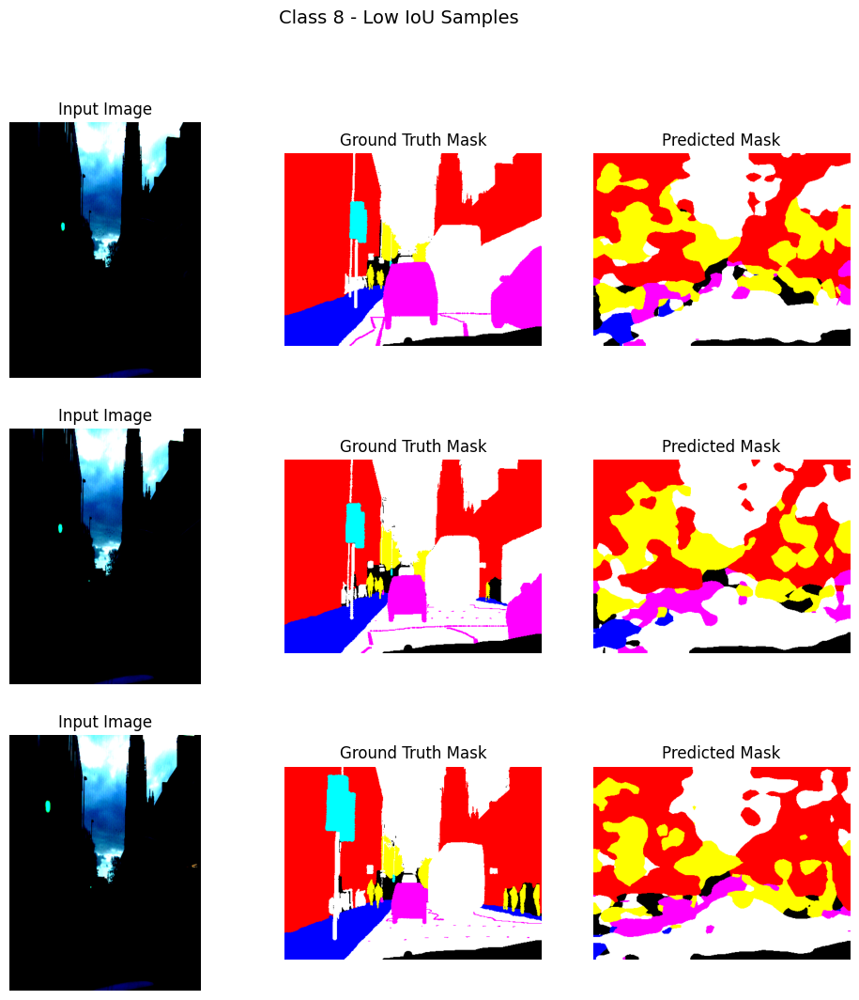

Fence


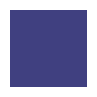

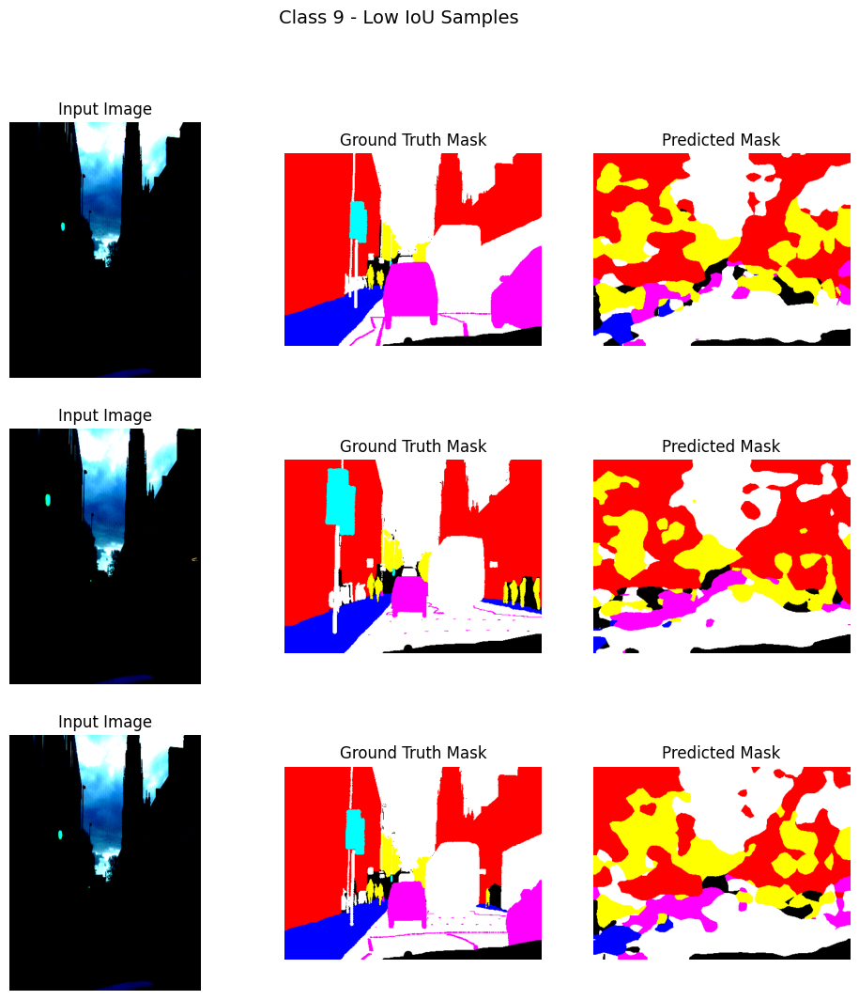

LaneMkgsDriv


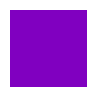

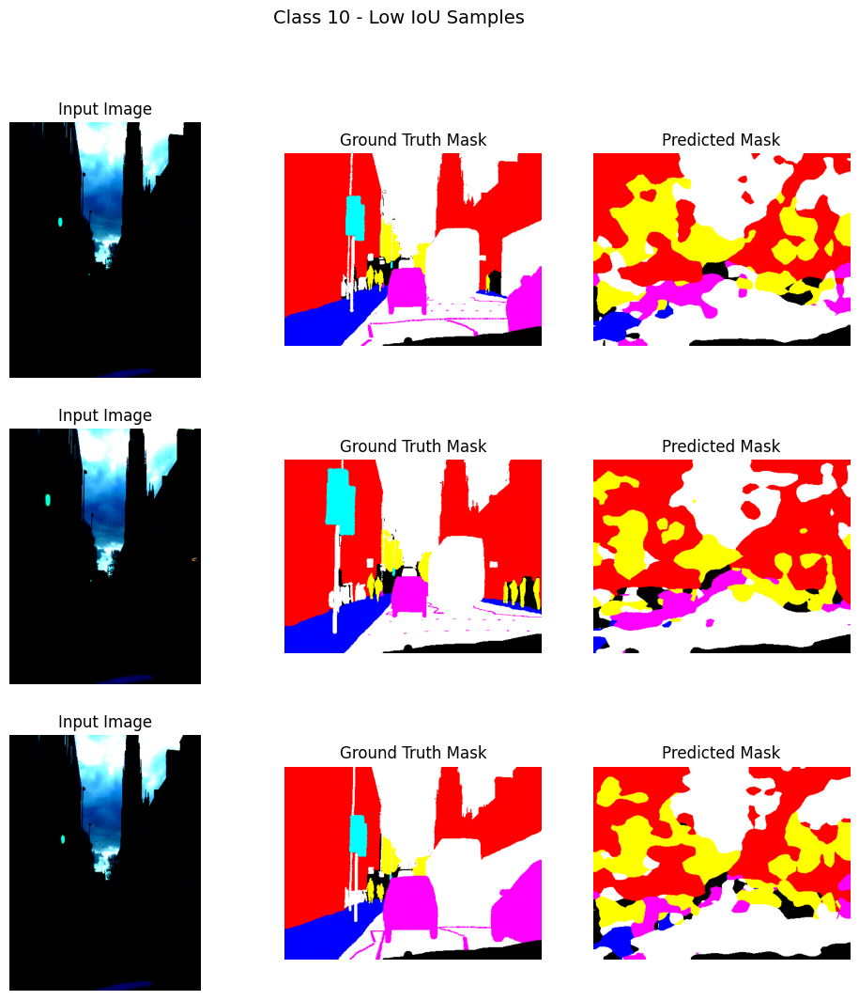

LaneMkgsNonDriv


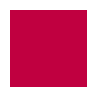

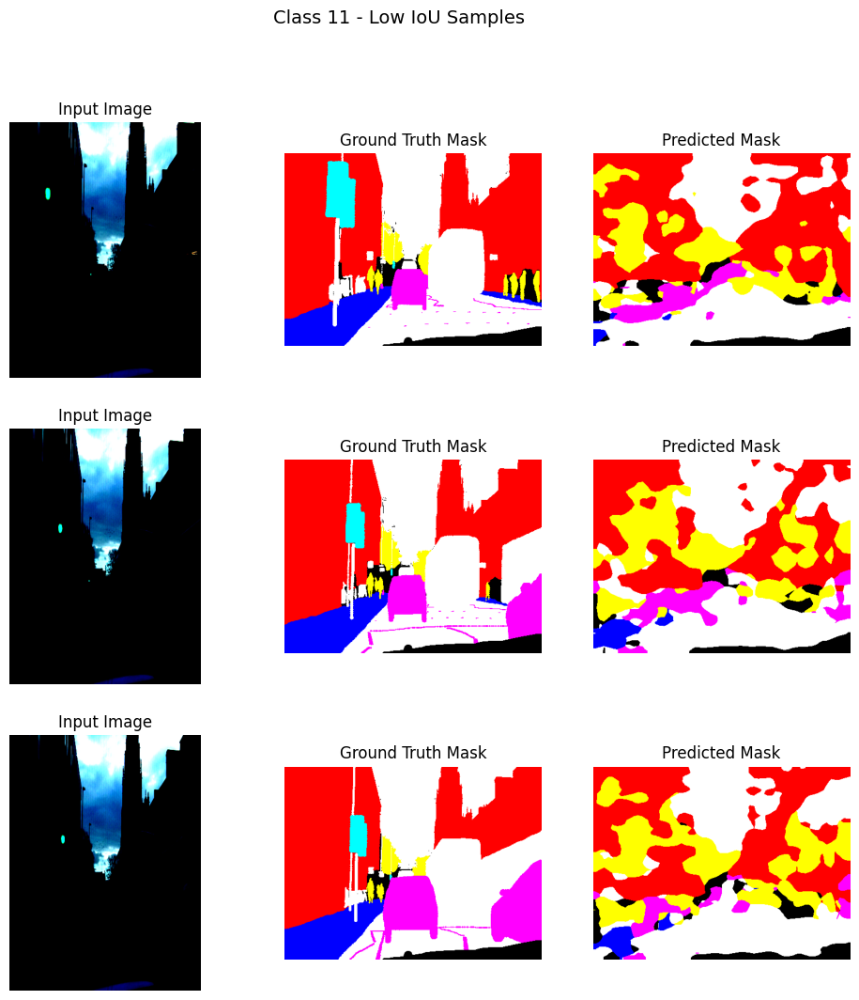

Misc_Text


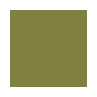

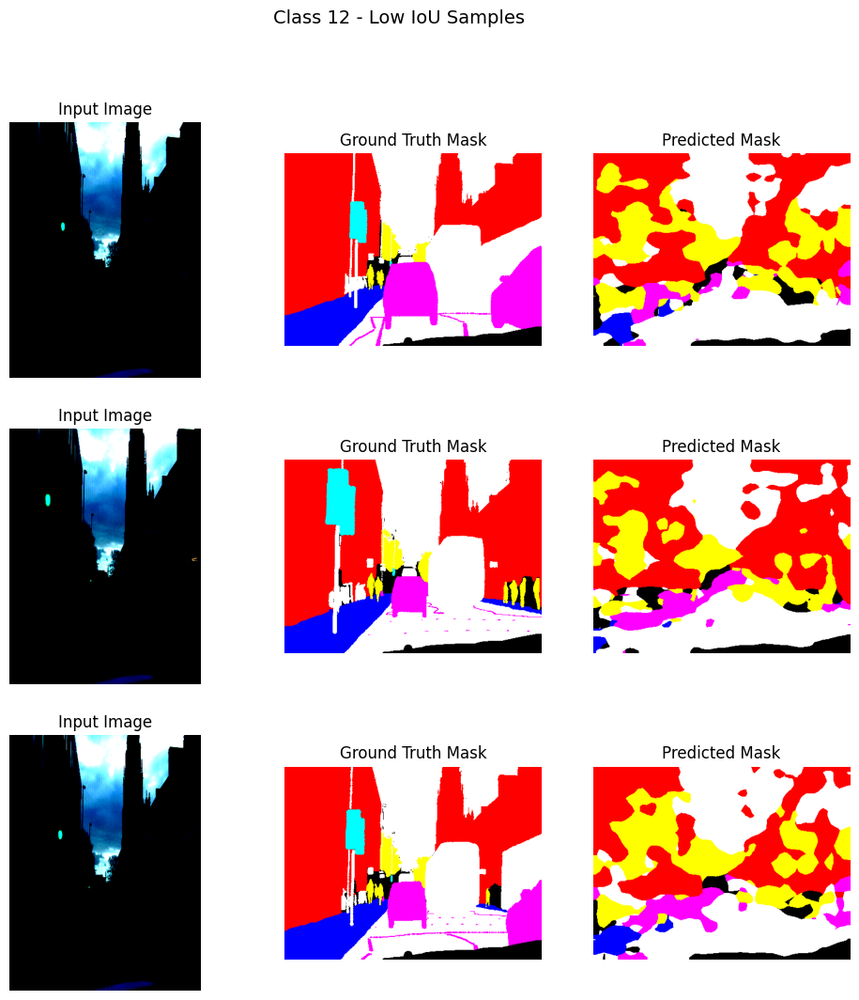

MotorcycleScooter


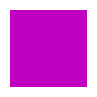

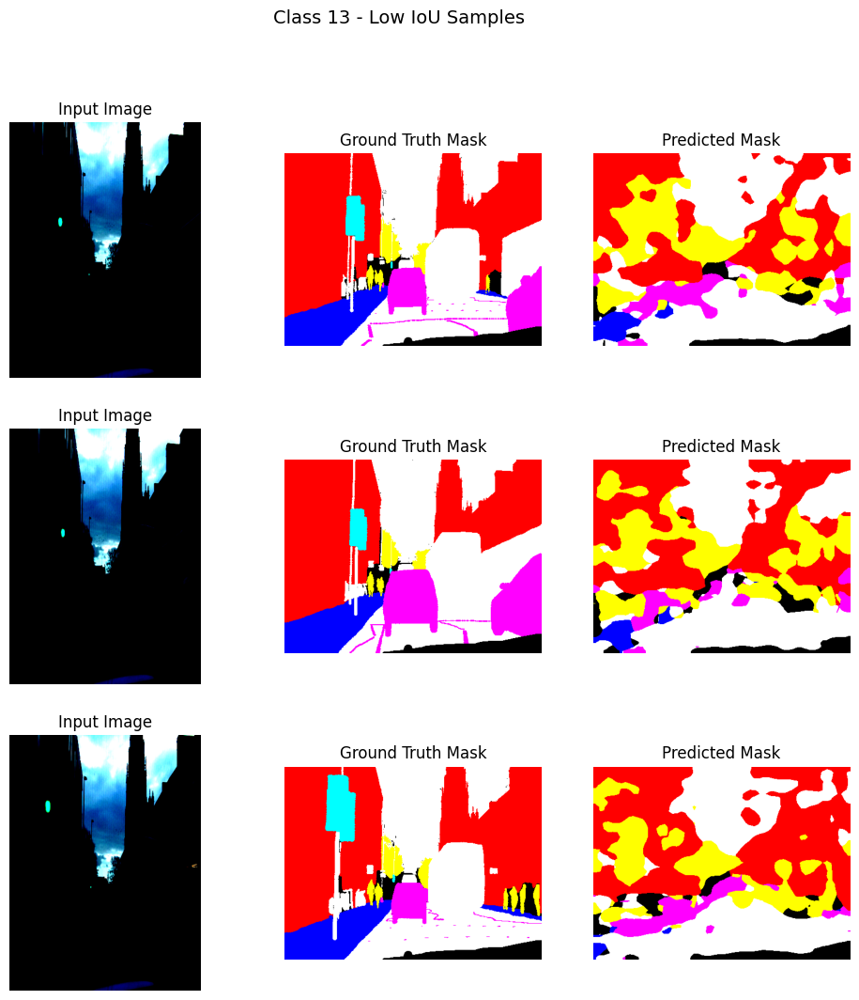

OtherMoving


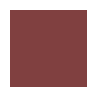

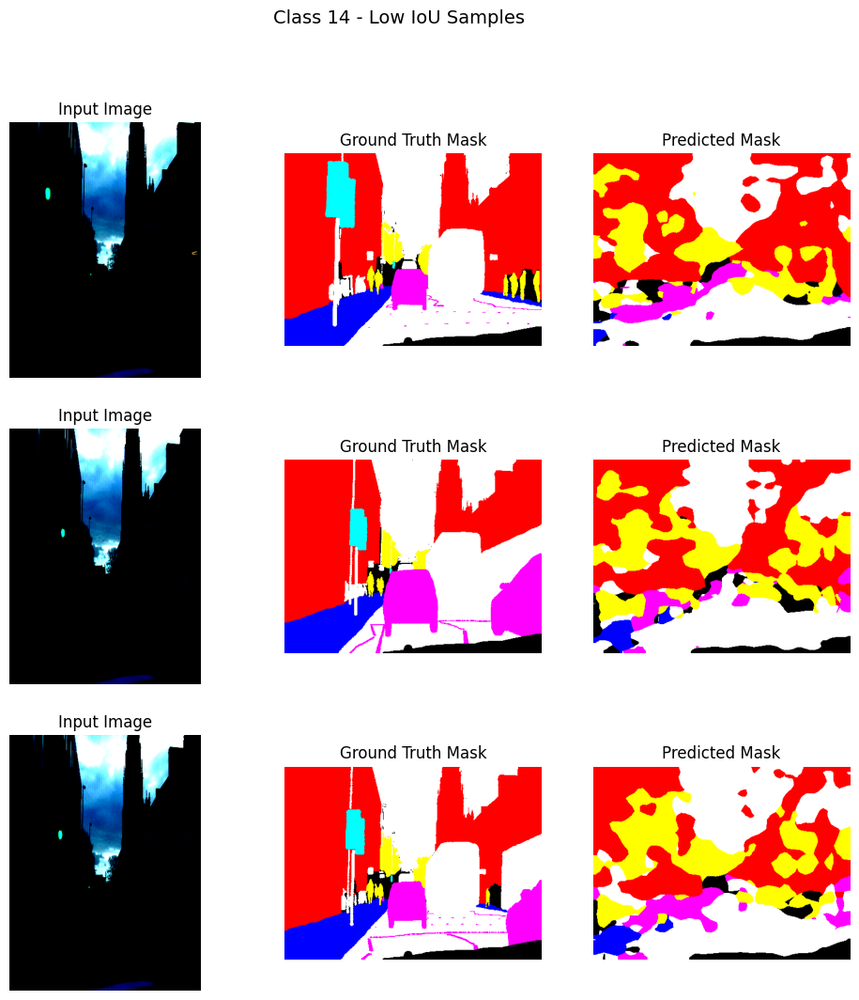

ParkingBlock


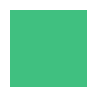

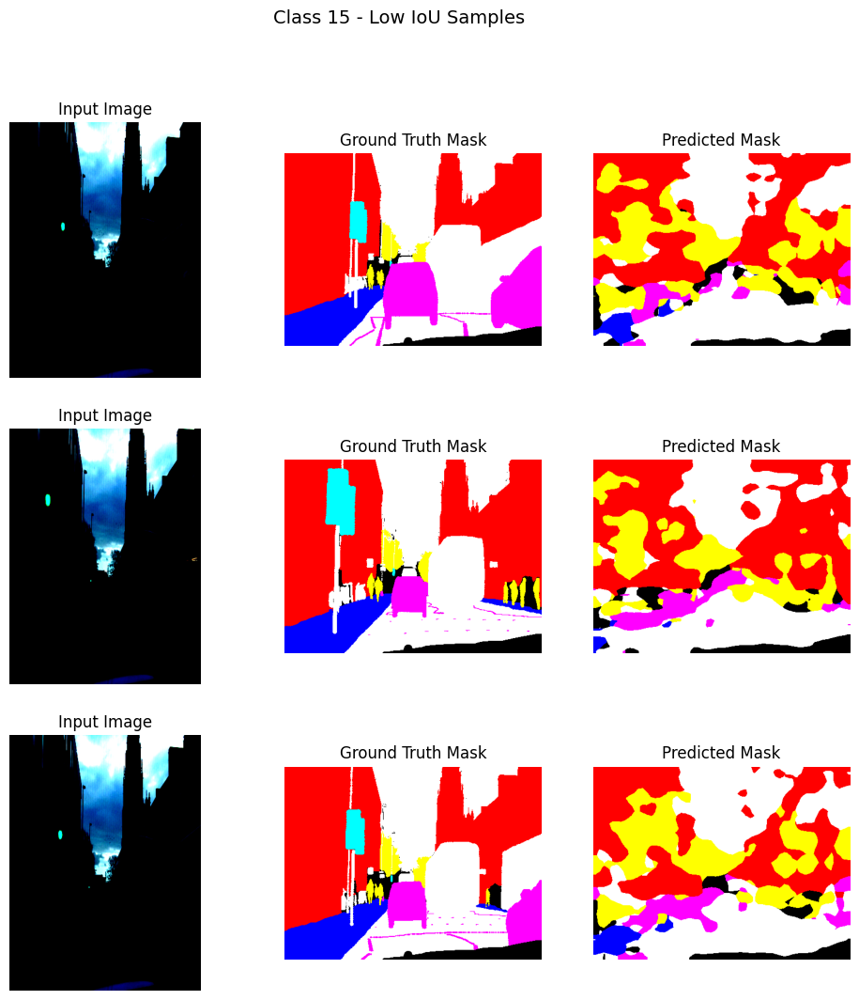

Pedestrian


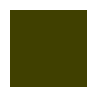

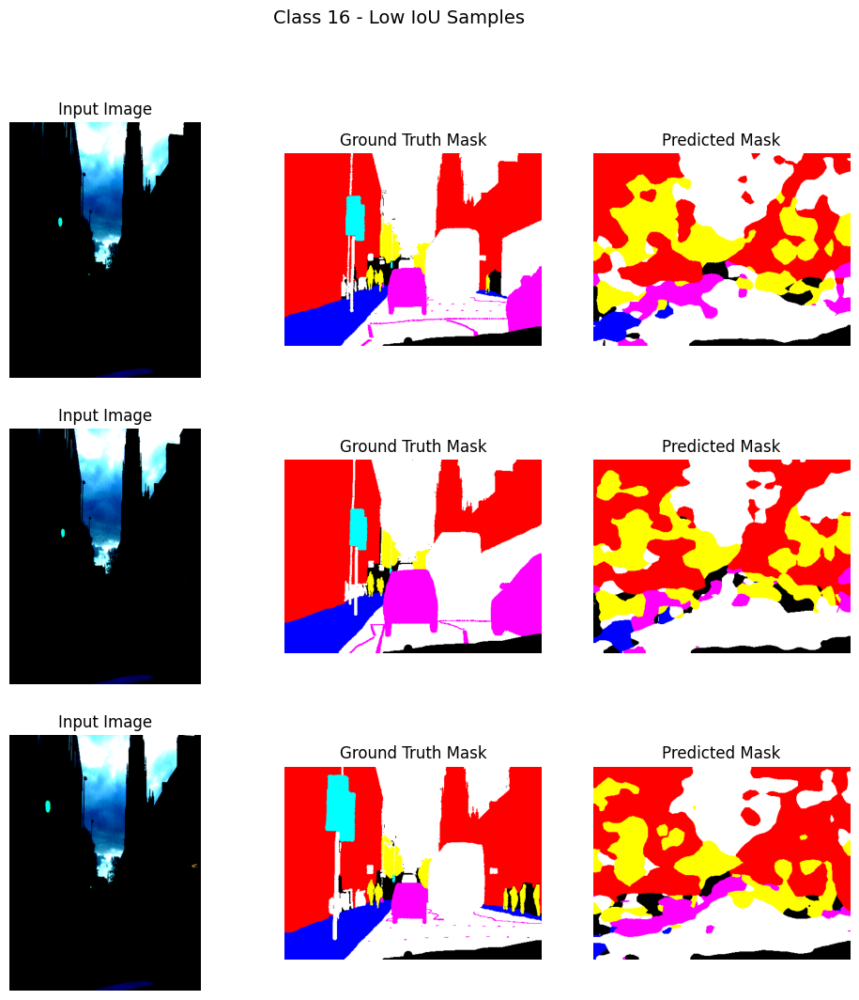

RoadShoulder


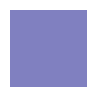

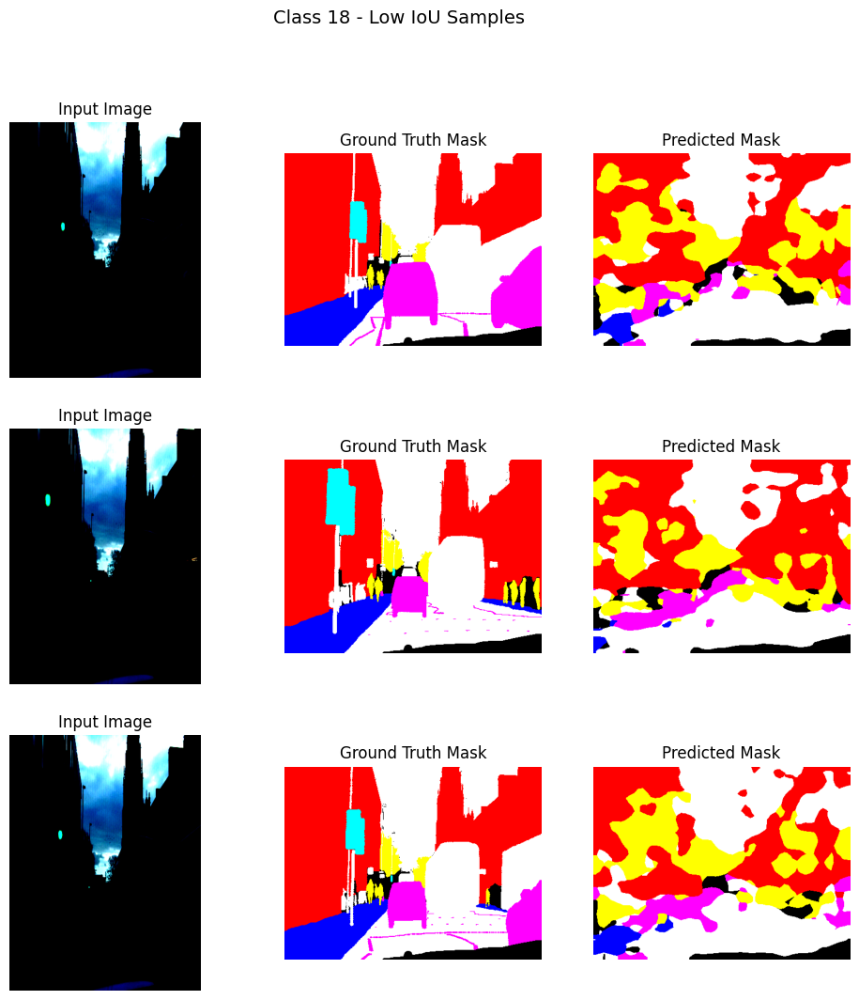

Sidewalk


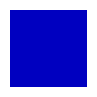

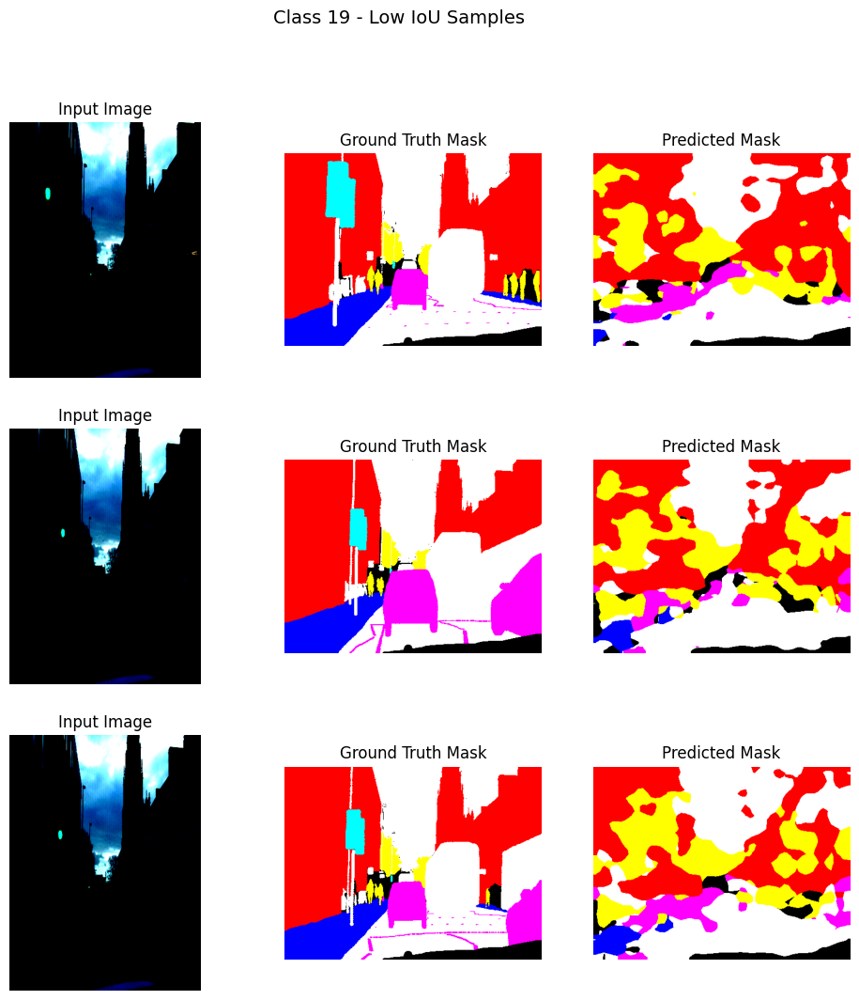

SignSymbol


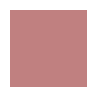

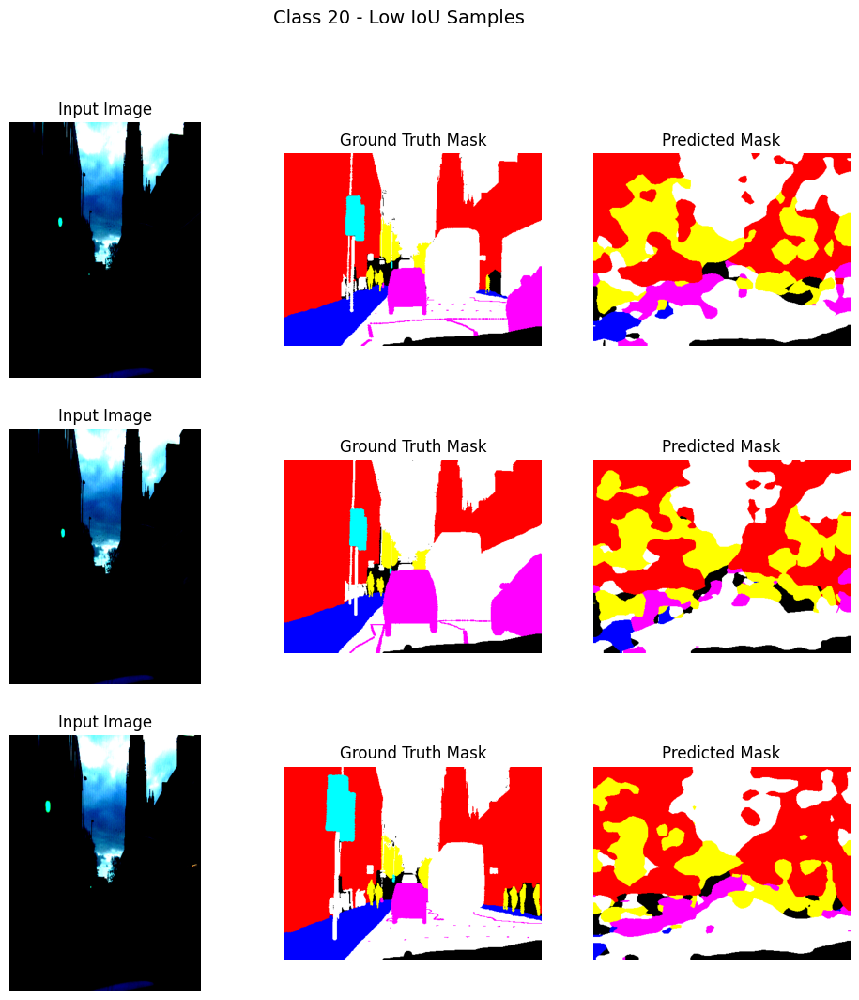

Sky


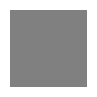

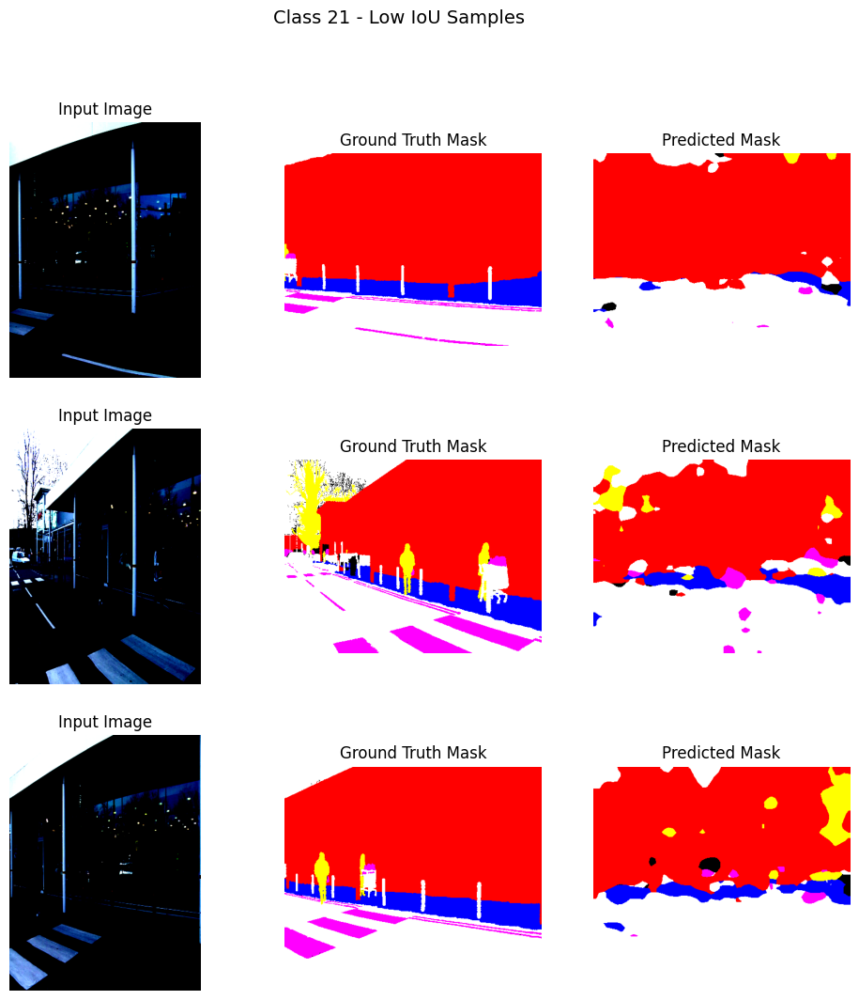

SUVPickupTruck


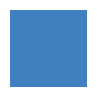

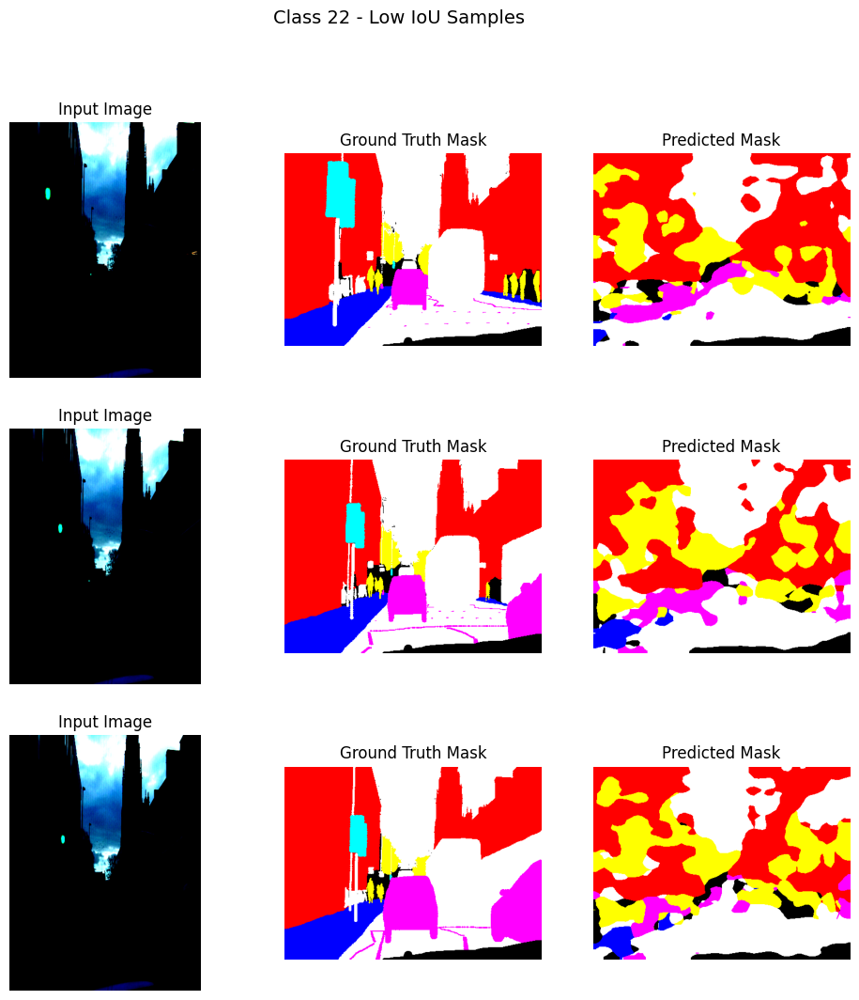

TrafficCone


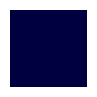

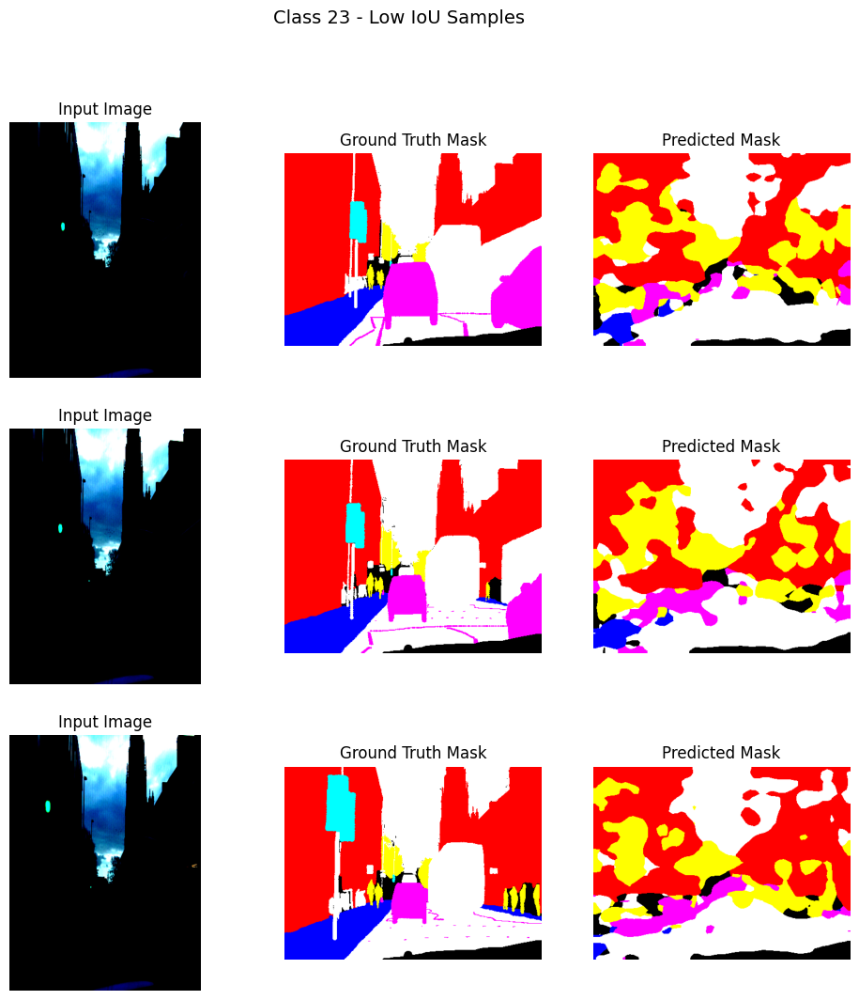

TrafficLight


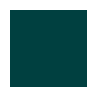

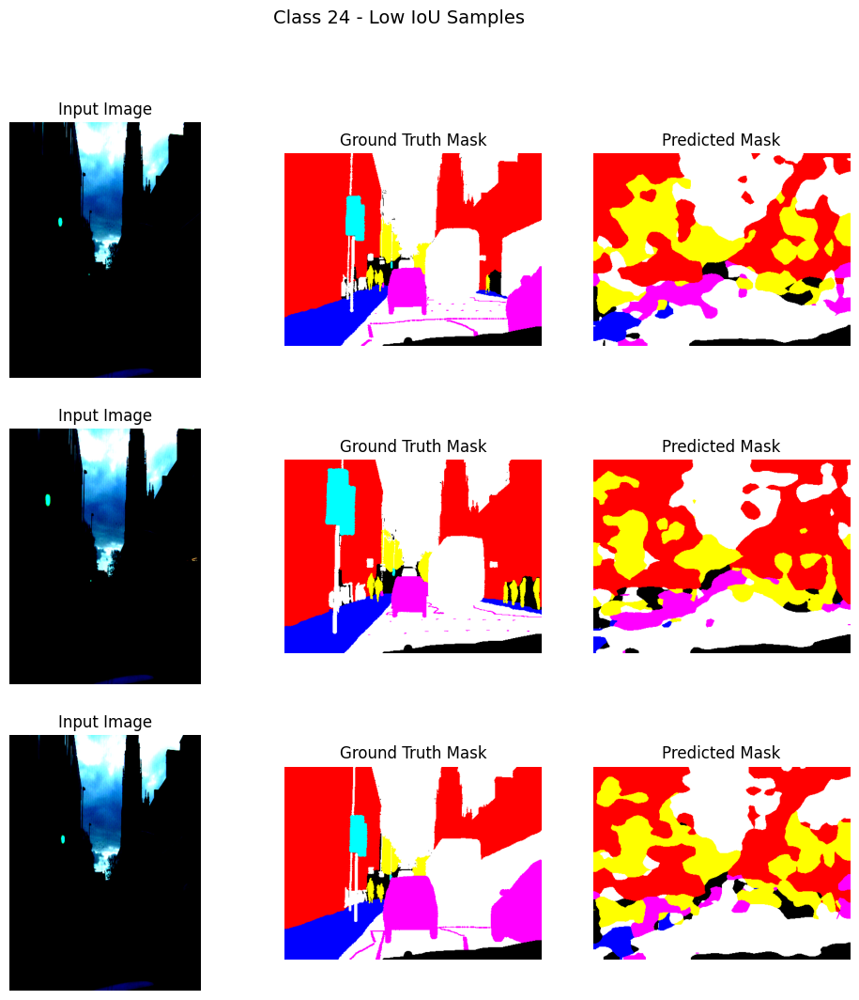

Train


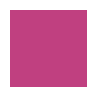

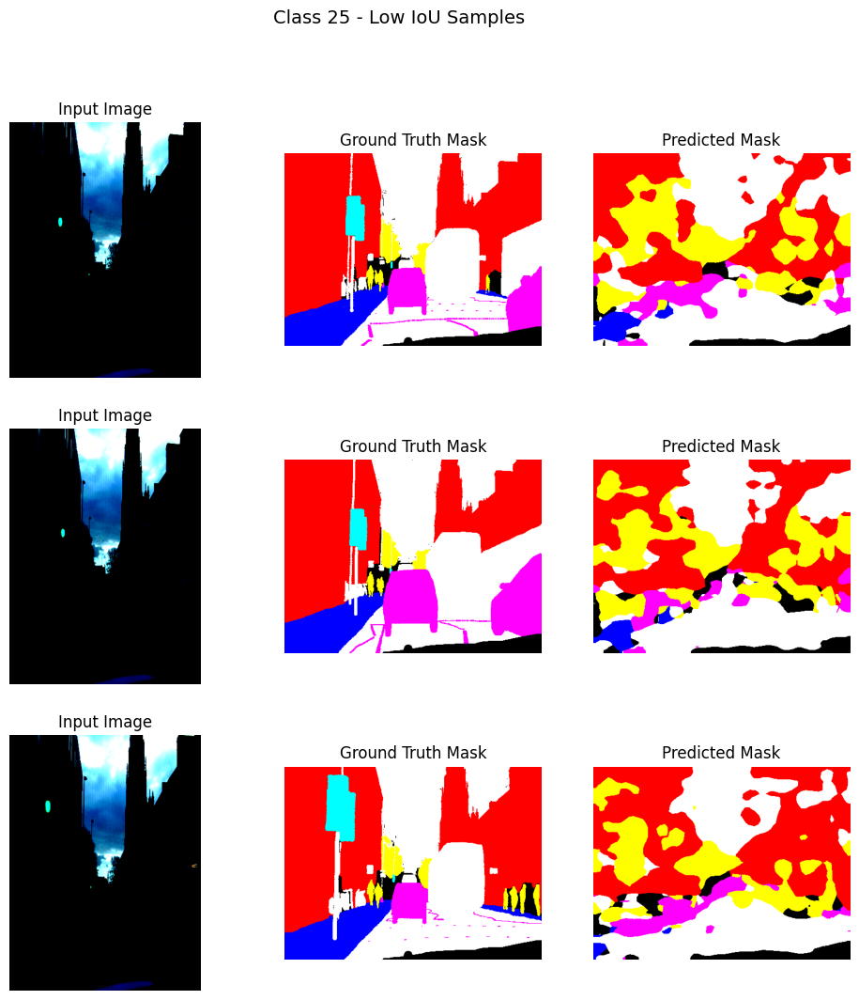

Tree


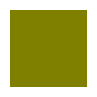

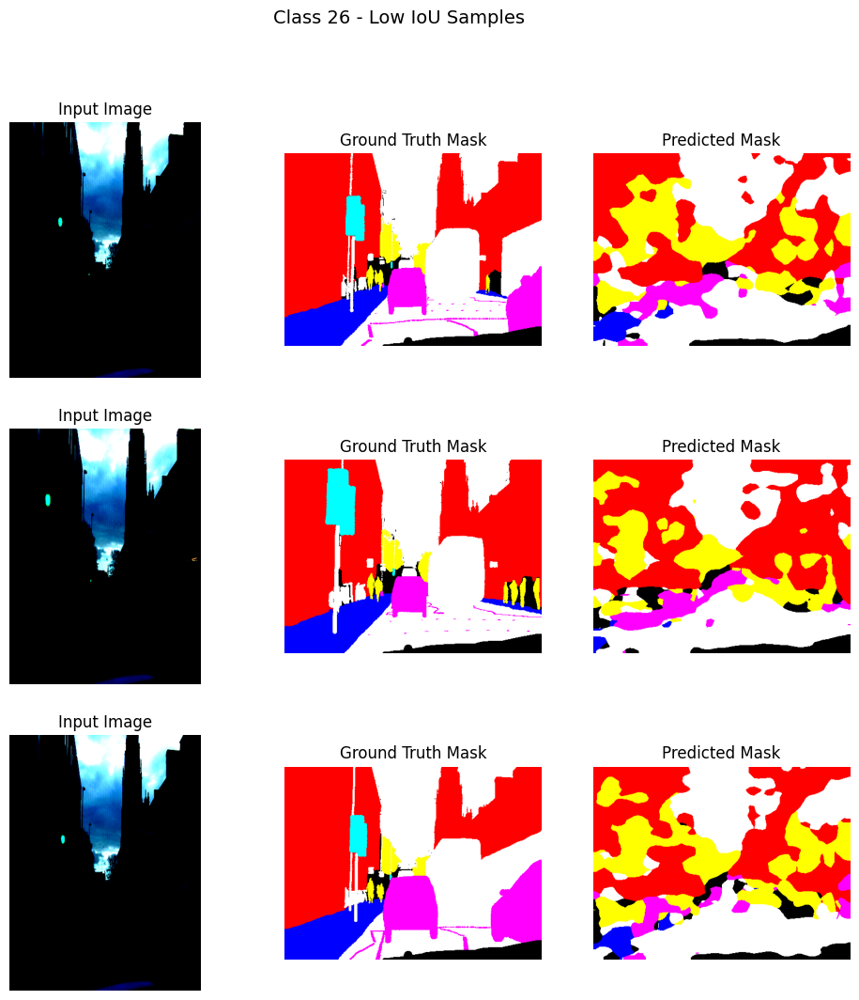

Truck_Bus


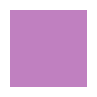

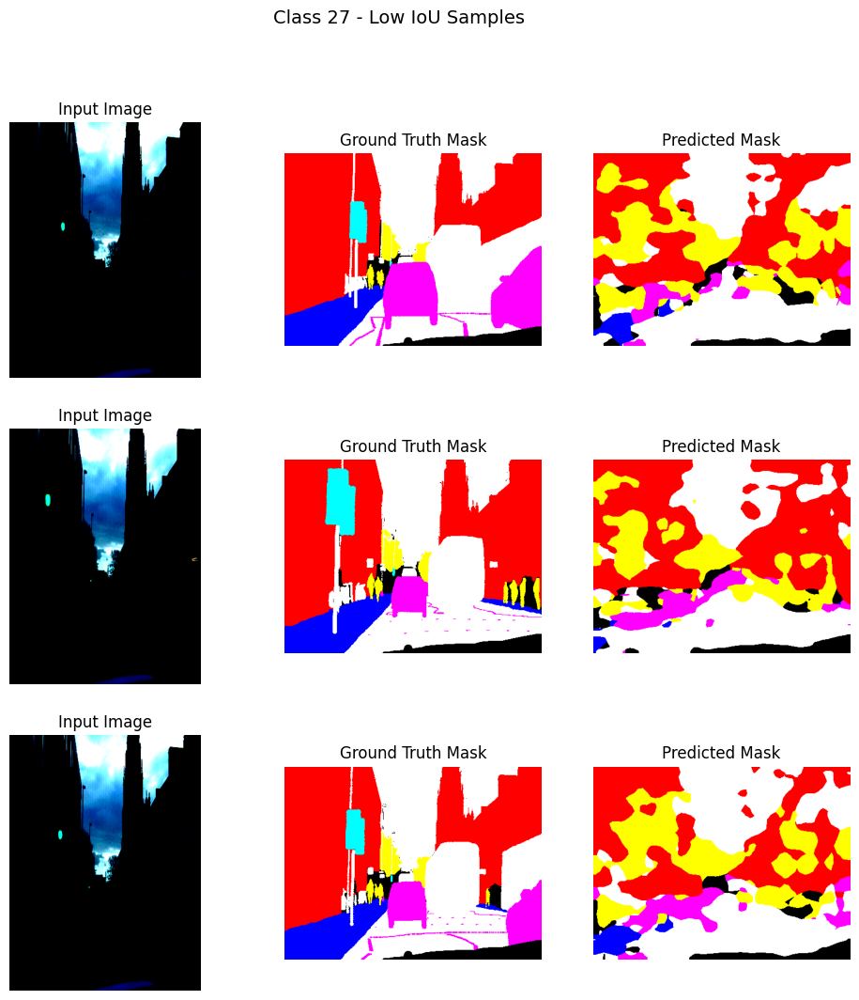

Tunnel


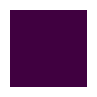

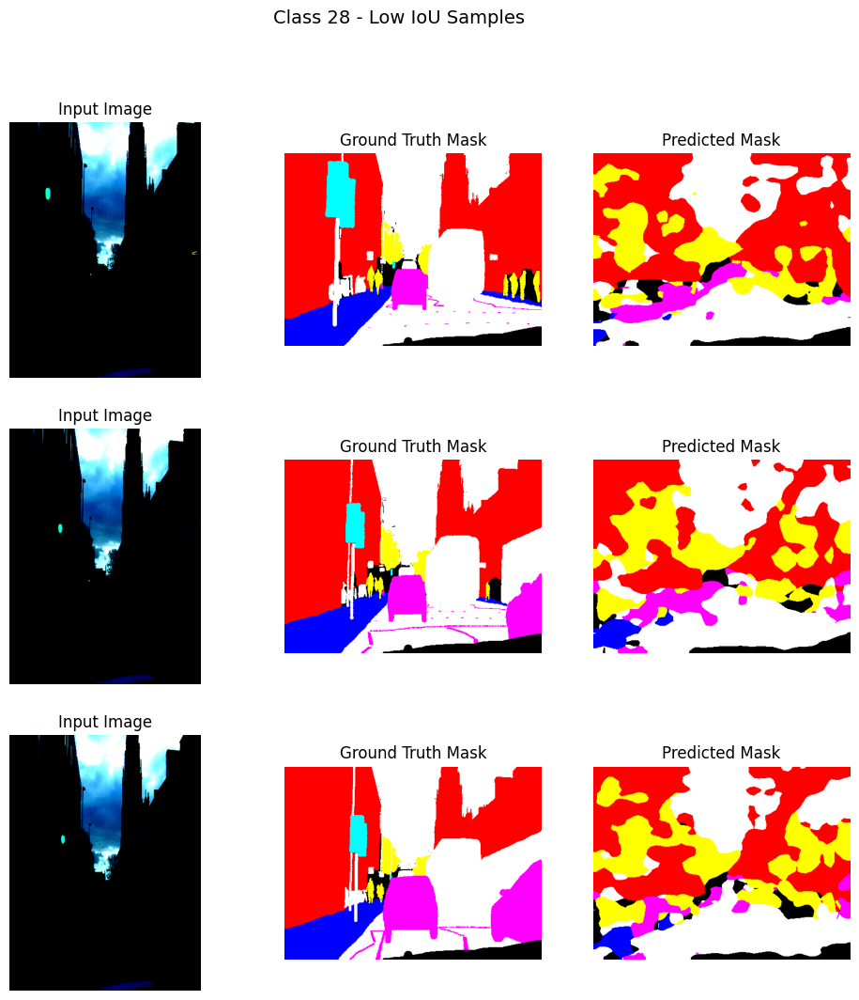

VegetationMisc


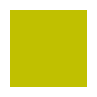

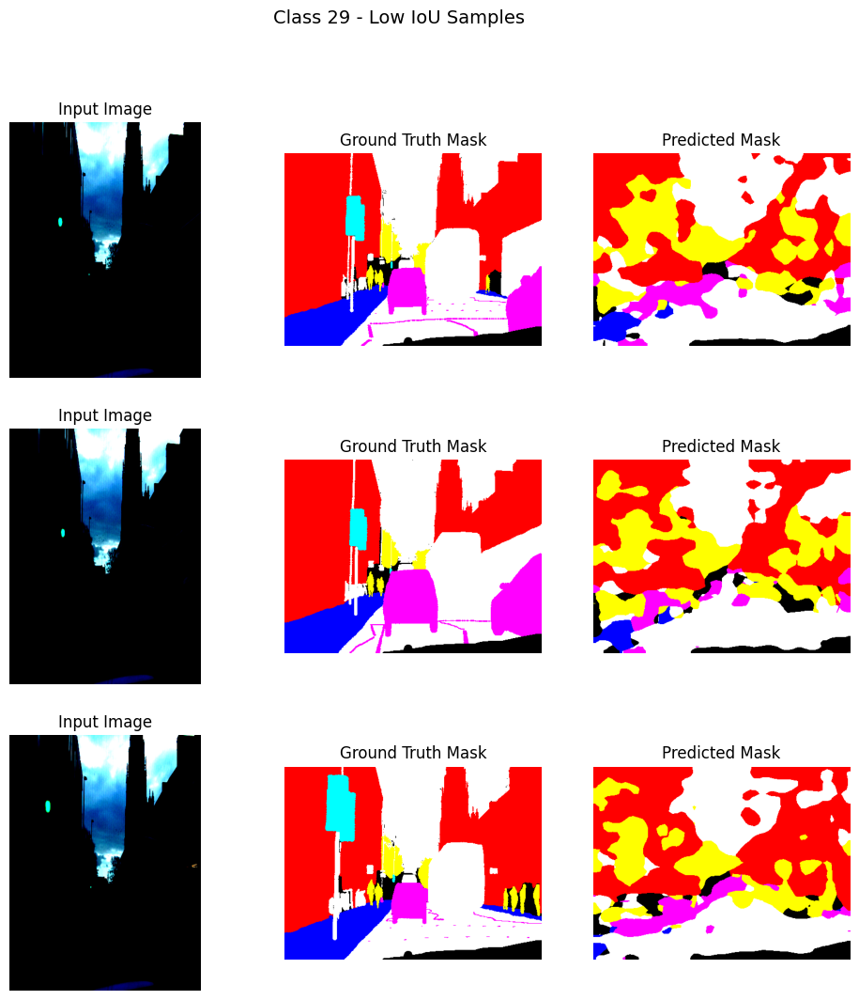

Void


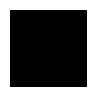

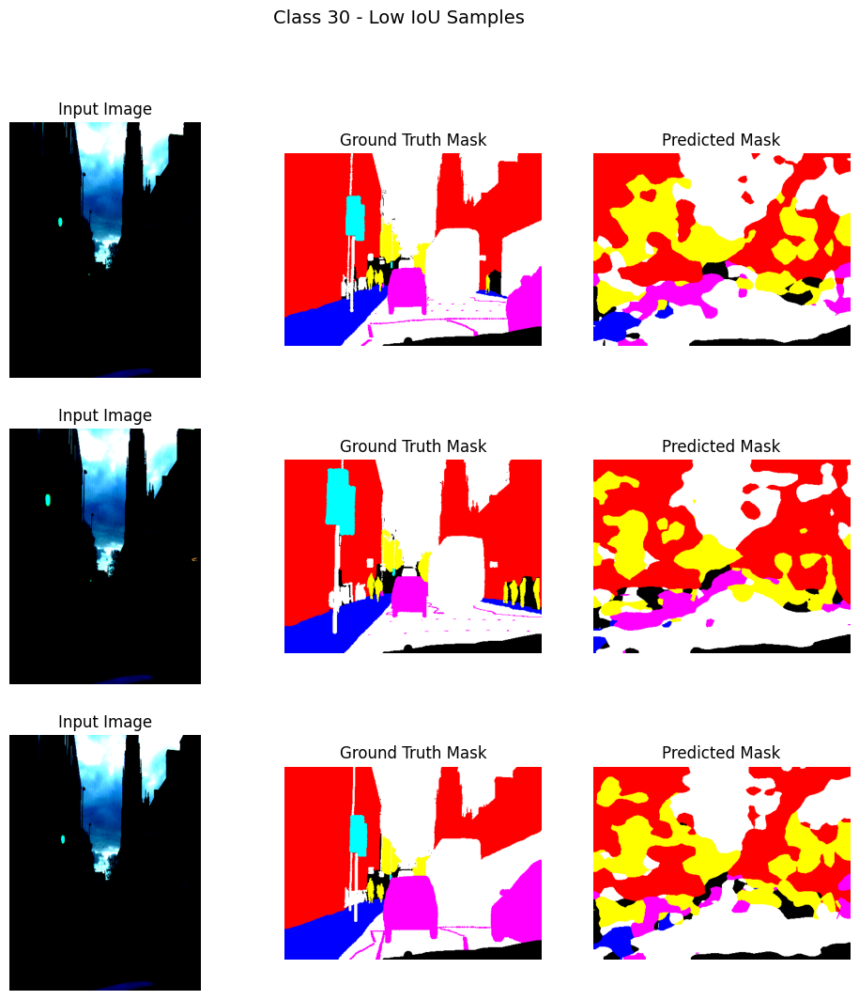

Wall


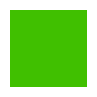

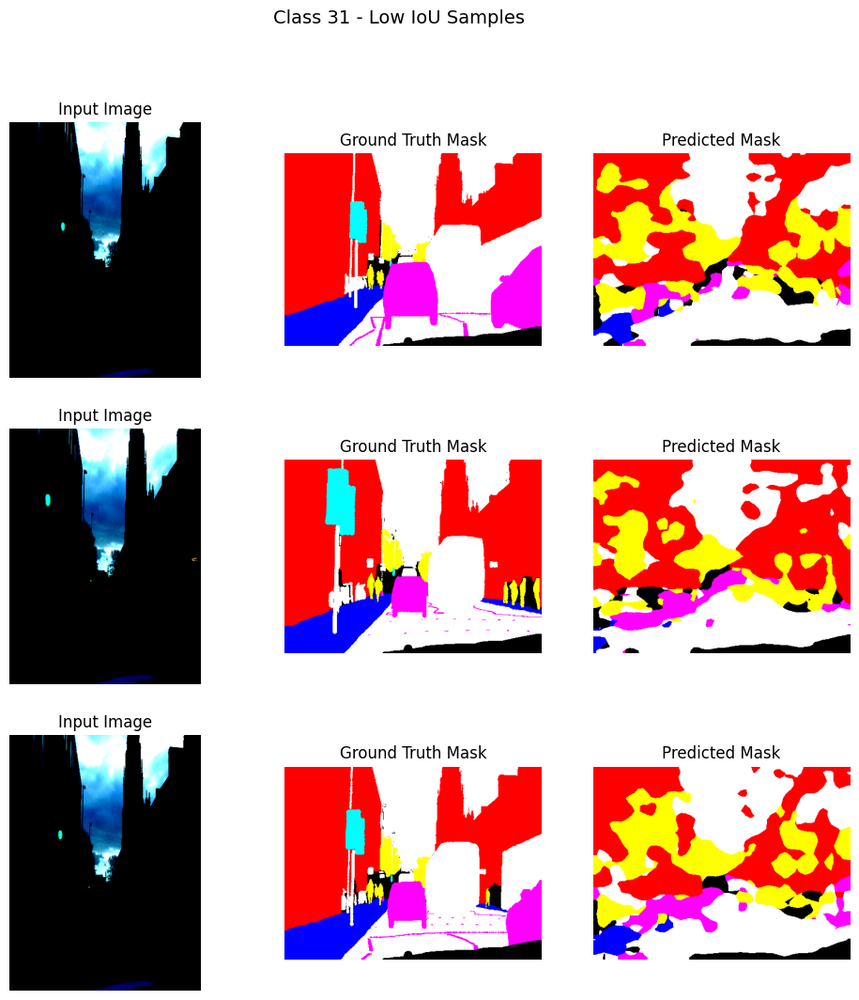

In [40]:
visualize_samples(iou_samples, 32)